# R Packages Run Time Validation Analysis

**Economics 430: Project 2**

**Fall 2023**

**Group Members:**
- Mauricio Vargas Estrada
- Luis Alejandro Samayoa Alvarado
- Sultan Al Balushi
- Oishika Kar

<h2 id="index">Index</h2>


1. <a href="#introduction">Introduction</a>
2. <a href="#source-of-the-data">Source of the Data</a>
3. <a href="#variable-selection">Variable Selection</a>
   - <a href="#boruta-algorithm">Boruta Algorithm</a>
4. <a href="#descriptive-analysis">Descriptive Analysis</a>
   - <a href="#unusual-observations-identification-and-removal">Unusual Observations Identification and Removal</a>
   - <a href="#transformation-of-variables">Transformation of Variables</a>
   - <a href="#descriptive-statistics">Descriptive Statistics</a>
   - <a href="#quantile-quantile-histograms-and-density-plots">Quantile-Quantile, Histograms, and Density Plots</a>
   - <a href="#correlation-and-pairplots">Correlation and Pairplots</a>
5. <a href="#model-selection">Model Selection</a>
   - <a href="#comparison-between-feasible-models">Comparison Between Feasible Models</a>
       - <a href="#model-with-untransformed-variables">Model with Untransformed Variables</a>
       - <a href="#model-with-optimal-yeo-johnson-transformation-for-each-variable">Model With Optimal Yeo-Johnson Transformation for each Variable</a>
       - <a href="#model-with-selected-transformation-for-each-variable">Model With Selected Transformation for each Variable</a>
6. <a href="#analysis-of-the-selected-model">Analysis of the Selected Model</a>
   - <a href="#robustness-analysis">Robustness Analysis</a>
   - <a href="#cross-validation">Cross-Validation</a>
   - <a href="#marginal-effects-analysis-and-parameter-interpretation">Marginal Effects Analysis and Parameter Interpretation</a>

--- 

<h1 id="introduction">Introduction </h1>
<a href="#index">Return to Index</a>

When an R package developer wishes to publish their package on CRAN, they must undergo a validation process. This process involves a series of tests conducted on the package to verify that it complies with CRAN standards. One of these tests is cross-validation, which involves running the `R CMD check` command on different platforms. The time it takes to execute this command is recorded in the `check_times.csv` file, which contains data from over 13,000 packages, including the respective execution time on each platform and the characteristics of each package, such as the number of dependencies, the number of files in the `src` directory, the number of files in the `data` directory, etc.

The objective of this project is to analyze the different characteristics of R packages and determine which of these characteristics influence the execution time of the `R CMD check` command. Additionally, it aims to determine if it is possible to predict the execution time of this command using the package's characteristics.    

<h2 id="source-of-the-data">Source of the Data</h2>

<a href="#index">Return to Index</a>

The dataset is part of the R `tidymodels` package and can be obtained with the following code:    

```r
library(tidymodels)
data("check_times")
```

The dataset is accessible in the following GitHub repository:  

- [https://github.com/vincentarelbundock/Rdatasets](https://github.com/vincentarelbundock/Rdatasets)

The complete list of variables can be found at the following link:  

-[https://vincentarelbundock.github.io/Rdatasets/doc/modeldata/check_times.html](https://vincentarelbundock.github.io/Rdatasets/doc/modeldata/check_times.html)  

Throughout this project, the selected from the above mentioned list for our analysis are:  

- `check_time` (dependent): The time (in seconds) to run ⁠R CMD check⁠ using the "r-devel-windows-ix86+x86_64' flavor.
- `depends`: The number of hard dependencies.
- `imports`: The number of imported packages.
- `r_size`: The total disk size of the R files.
- `src_size`: The size on disk of files in the src directory.
- `doc_size`: The disk size of the Rmd or Rnw files.
- `data_size`: The size on disk of files in the data directory.
- `Roxygen`: a binary indicator for whether Roxygen was used for documentation.
- `gh`: a binary indicator for whether the URL field contained a GitHub link.

> Arel-Bundock, V. (n.d.). *Rdatasets: A collection of datasets originally distributed in R packages*. GitHub. Retrieved November 18, 2023, from [https://github.com/vincentarelbundock/Rdatasets](https://github.com/vincentarelbundock/Rdatasets)

> Clarification Note:
>
> Many of the functions used in this project are part of the `src` package located in the folder of the same name in this repository. The package is of our authorship and is used to facilitate the analysis throughout the project.

In [1]:
# ----- Packages -----
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import os
import numpy as np

import statsmodels.api as sm
import statsmodels.formula.api as smf
# ----- Self-made Modules -----
from src.bootstrap_estimation import bootstrap_estimation
from src.bootstrap_yeojohnson import bootstrap_yeojohnson
from src.boruta_parallel import boruta_parallel
from src.cross_validation import cross_validation
from src.plot_diagnostic_plots import plot_diagnostic_plots
from src.FGLS_weights import FGLS_weights
from src.het_breuschpagan import het_breuschpagan
from src.influential_plot import influential_plot
from src.iterative_reset_omitted import iterative_reset_omitted
from src.mosaic_boot import mosaic_boot
from src.mosaic_hist import mosaic_hist
from src.mosaic_qq import mosaic_qq
from src.parallel_yeojohnson import parallel_yeojohnson
from src.ramsey_reset_test import ramsey_reset_test
from src.VIF_X import VIF_X
from src.generate_boxplots import generate_boxplots

# Turn off future warnings

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# ----- Loading dataset -----
data = pd.read_csv(
    os.path.join('data', 'check_times.csv')
)

# ----- Subset of variables -----
# Factor or category variables
col_cat = [
    'Roxygen',
    'gh',
]

# Dependent variables
col_dependent = ['check_time']

# Numerical variables
col_num = [
    col for col in data.columns if col not in col_cat + col_dependent
]


---

<h1 id="variable-selection">Variable Selection</h1>

<a href="#index">Return to Index</a>

<h2 id="boruta-algorithm">Boruta Algorithm</h2>
<a href="#index">Return to Index</a>

R[write to console]: Loading required package: foreach

R[write to console]: Loading required package: iterators

R[write to console]: Loading required package: parallel

R[write to console]:  1. run of importance source...



R[write to console]:  2. run of importance source...

R[write to console]:  3. run of importance source...

R[write to console]:  4. run of importance source...

R[write to console]:  5. run of importance source...

R[write to console]:  6. run of importance source...

R[write to console]:  7. run of importance source...

R[write to console]:  8. run of importance source...

R[write to console]:  9. run of importance source...

R[write to console]:  10. run of importance source...

R[write to console]:  11. run of importance source...

R[write to console]:  12. run of importance source...

R[write to console]: After 12 iterations, +1 mins: 

R[write to console]:  confirmed 19 attributes: authors, data_count, data_size, depends, doc_count and 14 more;

R[write to console]:  rejected 1 attribute: s4_methods;

R[write to console]:  still have 1 attribute left.


R[write to console]:  13. run of importance source...

R[write to console]:  14. run of importance source...

R[write to console

Boruta performed 99 iterations in 8.732755 mins.
 19 attributes confirmed important: authors, data_count, data_size,
depends, doc_count and 14 more;
 1 attributes confirmed unimportant: s4_methods;
 1 tentative attributes left: descr;


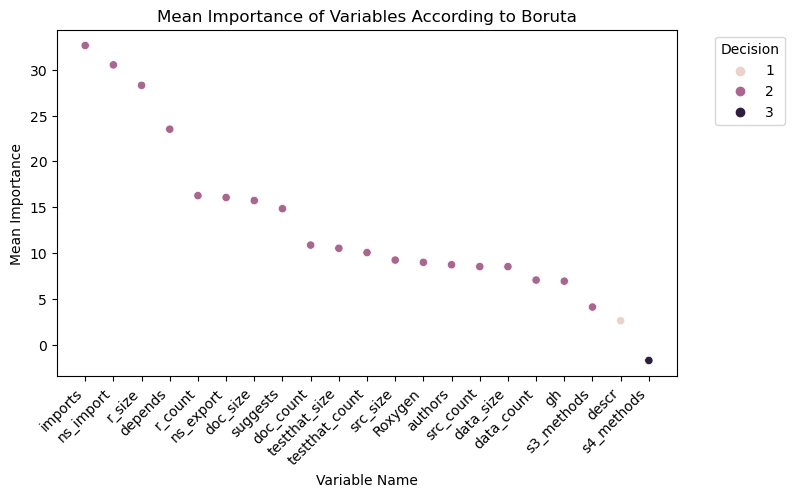

In [3]:
%config Completer.use_jedi = False

boruta_results = boruta_parallel(
    data = data,
    y_name = col_dependent[0]
)

In [4]:
boruta_df = boruta_results[0]

According to the Boruta analysis, the variables classified as category 2 are those that show greater importance with respect to the shadow characteristics.

To complement the variable selection, the absolute correlation matrix (percentage) is calculated. This allows for the selection of variables with high importance and low correlation between them.

In [5]:
abs_corr = data[col_dependent + list(boruta_df.index)].corr().abs()
abs_corr = abs_corr * 100
abs_corr = abs_corr.round(2)

abs_corr

,check_time,imports,ns_import,r_size,depends,r_count,ns_export,doc_size,suggests,doc_count,...,src_size,Roxygen,authors,src_count,data_size,data_count,gh,s3_methods,descr,s4_methods
check_time,100.00,45.52,39.01,43.27,19.29,32.35,20.86,36.17,36.38,35.50,...,3.43,16.05,4.53,18.47,7.36,9.42,13.69,23.20,14.90,8.91
imports,45.52,100.00,56.12,33.32,8.57,26.61,24.46,17.25,29.80,23.41,...,0.68,34.79,0.31,1.00,3.69,2.89,25.50,16.77,12.36,7.45
ns_import,39.01,56.12,100.00,33.42,9.01,27.94,27.48,13.82,25.29,18.04,...,0.28,27.95,0.93,3.10,2.39,4.82,17.38,22.11,9.94,10.90
r_size,43.27,33.32,33.42,100.00,17.10,59.06,43.85,24.63,25.14,18.84,...,6.30,4.64,7.64,19.76,3.61,13.32,4.15,39.38,16.93,12.09
depends,19.29,8.57,9.01,17.10,100.00,13.38,3.34,5.77,0.18,0.06,...,1.03,16.65,5.48,3.30,9.50,7.76,12.03,6.29,1.71,5.66
r_count,32.35,26.61,27.94,59.06,13.38,100.00,38.20,17.04,22.23,14.00,...,2.72,1.06,5.23,16.31,2.61,15.62,5.55,37.38,11.71,8.93
ns_export,20.86,24.46,27.48,43.85,3.34,38.20,100.00,15.01,23.50,19.11,...,3.68,18.50,1.03,18.74,0.27,1.56,13.54,37.50,9.05,13.09
doc_size,36.17,17.25,13.82,24.63,5.77,17.04,15.01,100.00,30.61,60.27,...,1.79,6.35,0.49,9.87,2.32,8.55,9.54,13.93,10.66,6.18
suggests,36.38,29.80,25.29,25.14,0.18,22.23,23.50,30.61,100.00,43.26,...,0.33,27.42,4.04,4.84,3.89,7.55,29.71,28.41,8.09,6.74
doc_count,35.50,23.41,18.04,18.84,0.06,14.00,19.11,60.27,43.26,100.00,...,0.87,19.12,2.31,6.89,1.62,7.12,21.19,13.96,8.64,7.67


Under this criterion, the selected variables are:
- `check_time` (dependent): The time (in seconds) to run ⁠R CMD check⁠ using the "r-devel-windows-ix86+x86_64' flavor.
- `depends`: The number of hard dependencies.
- `imports`: The number of imported packages.
- `r_size`: The total disk size of the R files.
- `src_size`: The size on disk of files in the src directory.
- `doc_size`: The disk size of the Rmd or Rnw files.
- `data_size`: The size on disk of files in the data directory.

<h2 id="factor-variables-selection">Factor Variables Selection</h2>

<a href="#index">Return to Index</a>

In the original dataset, the following categorical variables are found:
- `Roxygen`: a binary indicator for whether Roxygen was used for documentation.
- `gh`: a binary indicator for whether the URL field contained a GitHub link.
- `status`: An indicator for whether the tests completed.
- `rforge`: a binary indicator for whether the URL field contained a link to R-forge.

Of these categorical variables, `status` is used to eliminate those packages that did not complete the validation test. This means that this variable is removed from the dataset for the model because it would only contain values of 1.

Since all the remaining packages contain links to R-forge, this variable is also removed from the dataset.

Consequently, the dataset used in subsequent sections will contain only the categorical variables `Roxygen` and `gh`.

In [6]:
# ----- Subset of variables -----
col_num = ['depends', 'imports', 'r_size', 'src_size', 'doc_size', 'data_size']


---

<h1 id="descriptive-analysis">Descriptive Analysis</h1>
<a href="#index">Return to Index</a>

<h2 id="unusual-observations-identification-and-removal">Unusual Observations Identification and Removal</h2>

<a href="#index">Return to Index</a>



For the selection of unusual observations, an auxiliary model is defined using the variables selected in the previous section. Subsequently, studentized residuals, leverage, and Cook's distance are used to classify observations as unusual. Finally, the unusual observations are eliminated, and the model is re-estimated.

In [7]:
# ----- Subsetting the dataset -----
data = data[col_dependent + col_num + col_cat]

In [8]:
# ----- Constructing the linear model string -----
col_independent = col_num + col_cat
lm_string = col_dependent[0] + '~'
for i in range(len(col_independent)):
    if i == 0:
        lm_string = lm_string + col_independent[i]
    else:
        lm_string = lm_string + '+' + col_independent[i]

In [9]:
# ----- Auxiliary model -----
model_aux = smf.ols(lm_string, data = data).fit()

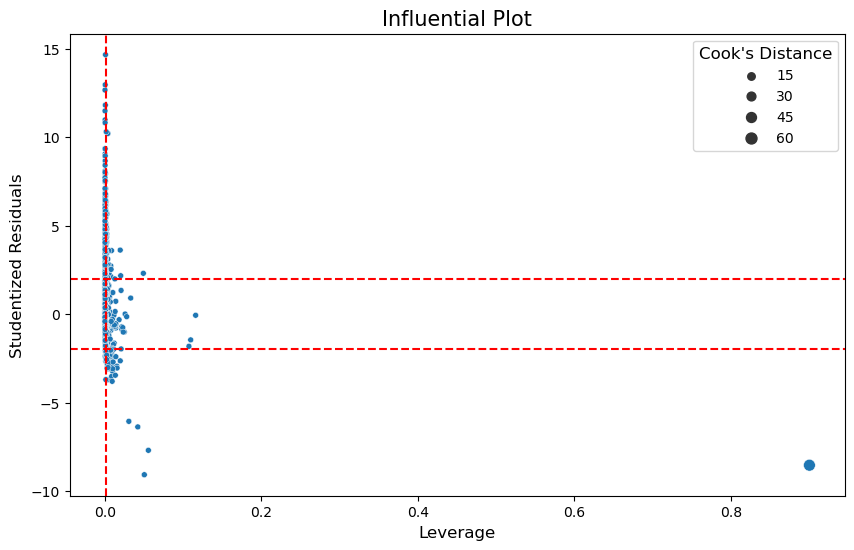

In [10]:
influential_plot(model_aux)

In [11]:
# ----- Extracting unusual observations measures -----
residual_measures = data.copy()
residual_measures['studentized_residuals'] = model_aux.get_influence().resid_studentized_internal
residual_measures['abs_studentized_residuals'] = residual_measures['studentized_residuals'].abs()
residual_measures['leverage'] = model_aux.get_influence().hat_matrix_diag
residual_measures['cooks_distance'] = model_aux.get_influence().cooks_distance[0]
residual_measures['abs_leverage'] = residual_measures['leverage'].abs()
mean_leverage = residual_measures['leverage'].mean()

In [12]:
# Checking how many observations are not outliers.
residual_measures['not_outlier'] = residual_measures.abs_studentized_residuals < 2
# Checking how many observations are not leverage points.
residual_measures['not_leverage'] = residual_measures.leverage < 2 * mean_leverage
# Checking how many observations are not influential points.
residual_measures['not_influential'] = residual_measures.cooks_distance < 4 / len(data)
# Points that are not outliers, leverage points and influential points.
residual_measures['good_observation'] = residual_measures.not_outlier & residual_measures.not_leverage & residual_measures.not_influential

In [13]:
# ----- Filtering the dataset -----
data_filtered = data[residual_measures.good_observation]
data_filtered = data_filtered.reset_index(drop=True)

In [14]:
# ----- New auxiliary model without unusual observations -----
model_aux_filtered = smf.ols(lm_string, data = data_filtered).fit()

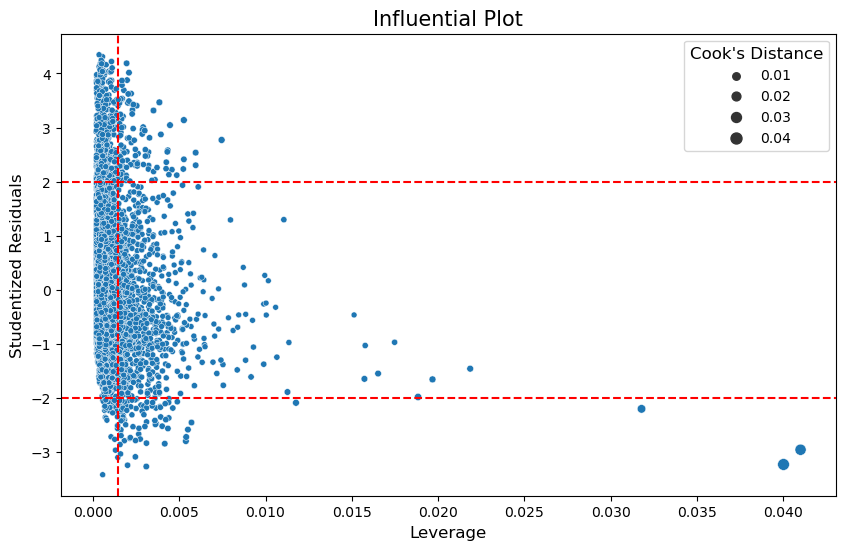

In [15]:
influential_plot(model_aux_filtered)

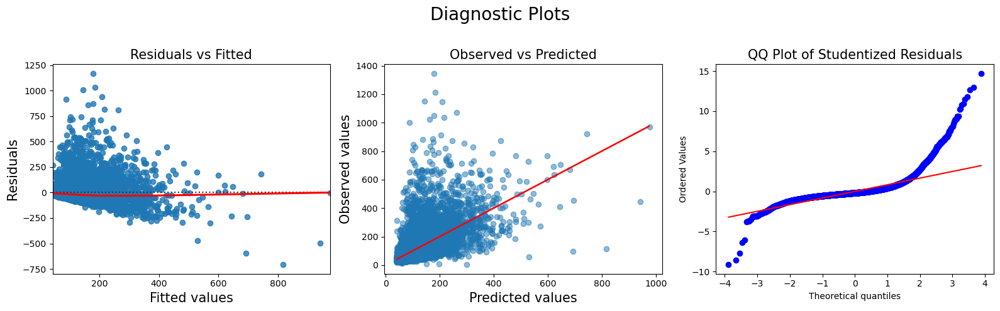

In [16]:
plot_diagnostic_plots(model_aux)

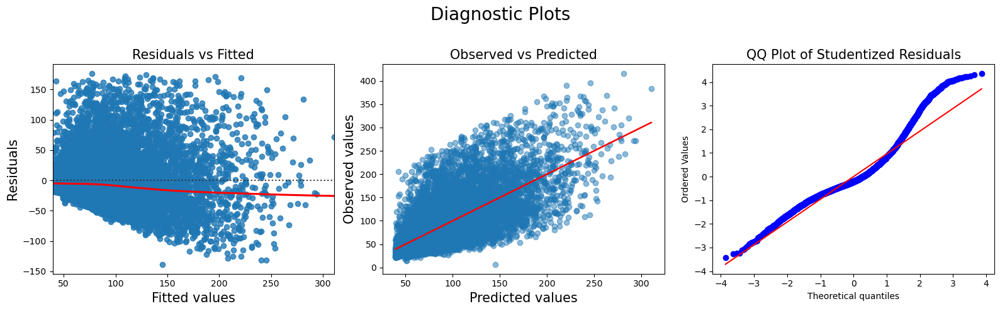

In [17]:
plot_diagnostic_plots(model_aux_filtered)

To find and eliminate unusual observations, we start by examining them with an influential plot, focusing on high leverage, extreme studentized residuals, and significant Cook's distances. We perform these steps to enhance the robustness and reliability of the regression model. This is because the outliers can compromise the predictability and reliability of statistical inferences. We use certain thresholds to determine unusual observations: 2 for studentized residuals, 2 times the mean for leverage, and 4 divided by the number of observations for Cook's Distance. After eliminating this unusual observation, the stability of the parameters of the model will increase.

**Thresholds**

* Studentized Residuals: $± 2$
* Leverage: $2 * \overline{leverage}$
* Cook' Distance: $\frac{4}{Nobs}$

<h2 id="transformation-of-variables">Transformation of Variables</h2>
<a href="#index">Return to Index</a>

As part of the procedures to analyze possible transformations, a Yeo-Johnson transformation was applied to each of the variables, calculating a bootstrap interval with a 95% confidence level for the transformation parameter $\lambda$.

In [18]:
# Calculating the optimal yeo-johnson transformation for each numeric variable. Also, the lower and upper bounds at 95% confidence interval.
data_yeo_filtered, lambda_yeo = parallel_yeojohnson(
    data_filtered[col_dependent + col_num]
)
data_yeo_filtered[col_cat] = data_filtered[col_cat]

In [19]:
# ----- Analyzing the optimal yeo-johnson transformation for each variable -----
lambda_yeo.T

,lambda,lambda_lower,lambda_upper
check_time,-0.180277,-0.205036,-0.158954
depends,-0.226295,-0.245304,-0.208124
imports,-0.225645,-0.25133,-0.204249
r_size,-15.171225,-15.526201,-14.831913
src_size,-57.980547,-61.946711,-54.271847
doc_size,-154.832484,-162.233725,-147.707247
data_size,-12.633594,-13.302252,-12.02253


In the previous table, the different values of lambda for each variable can be observed. From these estimations, the lambda values will be rounded in such a way that the value falls within the confidence interval.

In particular, `check_time` will be transformed with $\lambda = 0$ because this value is close to the confidence interval and provides properties that improve the interpretation of the parameters. This will be analyzed in more detail in the model selection section.

Additionally, the residuals are analyzed through an auxiliary regression, as was done in the previous section. The objective is to identify problems in a regression using the optimal Yeo-Johnson transformations.

In [20]:
model_aux_filtered_yeo = smf.ols(lm_string, data = data_yeo_filtered).fit()

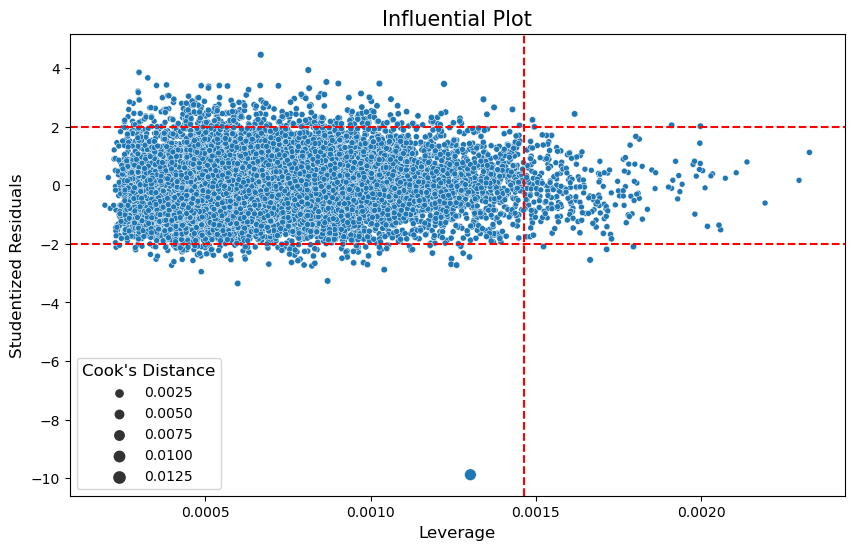

In [21]:
influential_plot(model_aux_filtered_yeo)

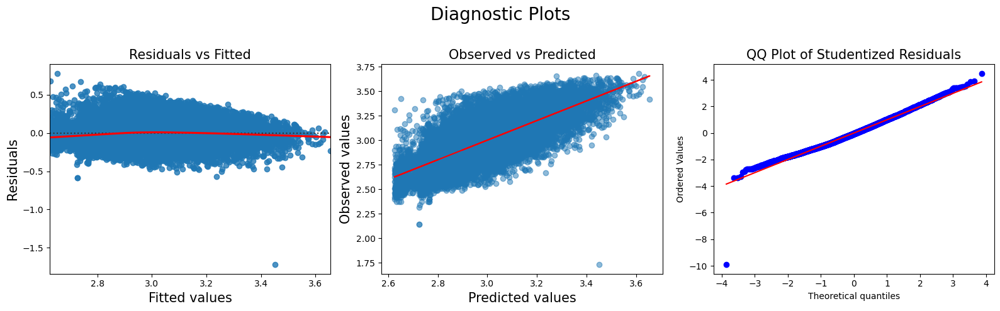

In [22]:
plot_diagnostic_plots(model_aux_filtered_yeo)

It can be observed that an appropriate transformation of variables following the filtering process results in a more robust dataset with stronger linear relationships. This is a clear indication of the need for variable transformation for our final model.

<h2 id="descriptive-statistics">Descriptive Statistics</h2>

<a href="#index">Return to Index</a>

As part of the procedures we check if there are any missing values in our variables.

In [23]:
def missing_values(data_frame):
    # create a empty dataframe
    missing_values = pd.DataFrame()
    # create a column with missing values
    missing_values['Are missing values?'] = data_frame.isnull().any(axis=0)
    # create a column with number of missing values
    missing_values['Number of missing values'] = data_frame.isnull().sum(axis=0)
# print dataframe
    return missing_values

missing_values(data)

,Are missing values?,Number of missing values
check_time,False,0
depends,False,0
imports,False,0
r_size,False,0
src_size,False,0
doc_size,False,0
data_size,False,0
Roxygen,False,0
gh,False,0


In [24]:
data.describe().round(2)

,check_time,depends,imports,r_size,src_size,doc_size,data_size,Roxygen,gh
count,13523.00,13523.00,13523.00,13523.00,13523.00,13523.00,13523.00,13523.0,13523.00
mean,109.39,1.44,3.25,0.08,0.03,0.01,0.17,0.5,0.30
std,101.03,1.51,4.24,0.16,0.43,0.03,0.71,0.5,0.46
min,6.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00
25%,50.00,0.00,0.00,0.01,0.00,0.00,0.00,0.0,0.00
50%,79.00,1.00,2.00,0.03,0.00,0.00,0.00,1.0,0.00
75%,129.00,2.00,5.00,0.08,0.00,0.00,0.02,1.0,1.00
max,1343.00,12.00,43.00,3.75,47.38,0.99,27.59,1.0,1.00


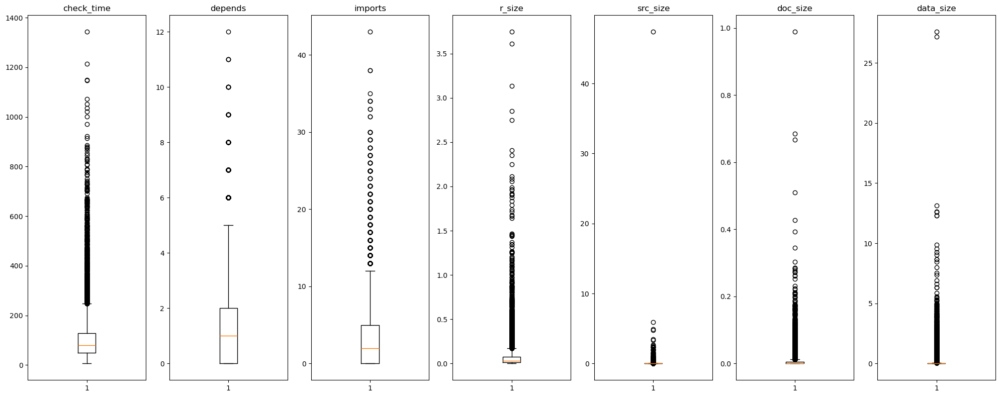

In [25]:
generate_boxplots(data)

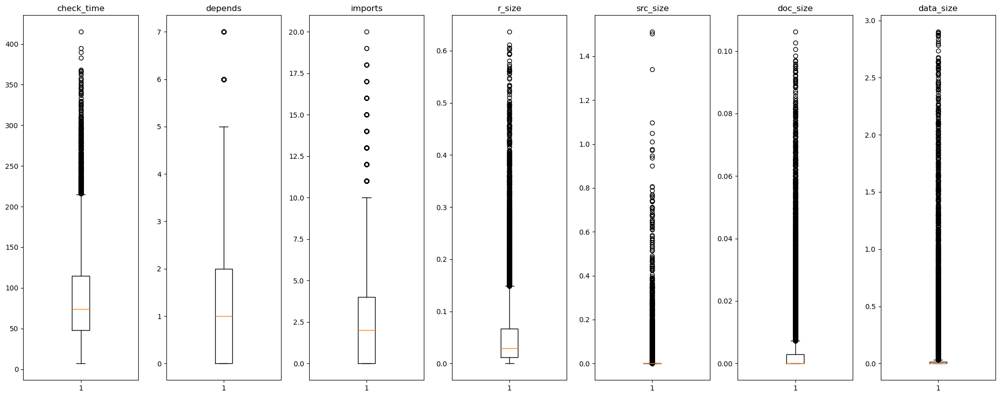

In [26]:
generate_boxplots(data_filtered)

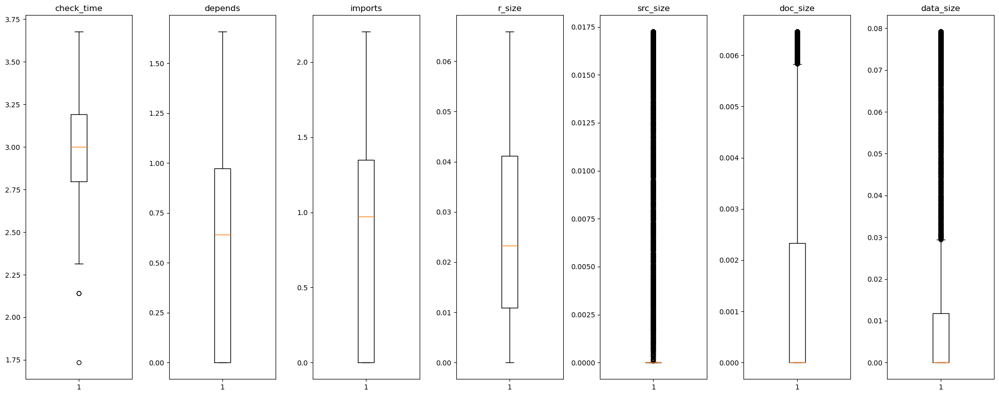

In [27]:
generate_boxplots(data_yeo_filtered)

The "Check_time" variable stands out from the other variables, with a mean above 109.39 seconds and a median close of 79 seconds. This shows a clear positive skewness in the distribution of this variable. The same occurs with variable depends, imports. This suggests that normalizing the variables is necessary to adjust for differences in magnitudes and expected variance in residuals before setting the final regression. 

After check the boxplots from numerical variable, we can see that the Yeo-Jonshon transformations proposed improve the distributions of almost all variables, mainly our dependent variable, "check_time".

<h2 id="quantile-quantile,-histograms-and-density-plots">Quantile-Quantile, Histograms and Density Plots</h2>

<a href="#index">Return to Index</a>

#### Q-Q plots, Histogram and Density plots of unfiltered and untransformed variables

Text(0.5, 0.98, 'Quantile-Quantile Plots')

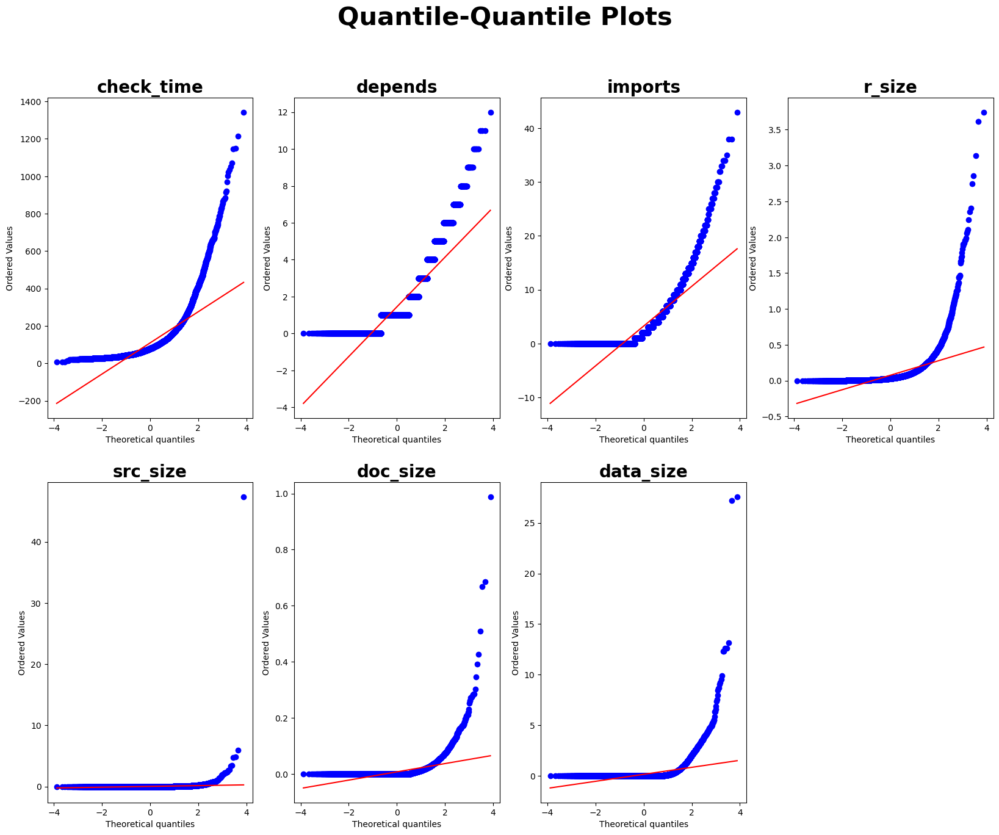

In [28]:
fig =  mosaic_qq(
            data=data,
            variables=col_dependent + col_num,
            figsize=(20,15),
            ncols= 4,
            title_fontsize=20
        )
fig[0].suptitle('Quantile-Quantile Plots', fontsize=30, fontweight='bold')

Text(0.5, 0.98, 'Histograms')

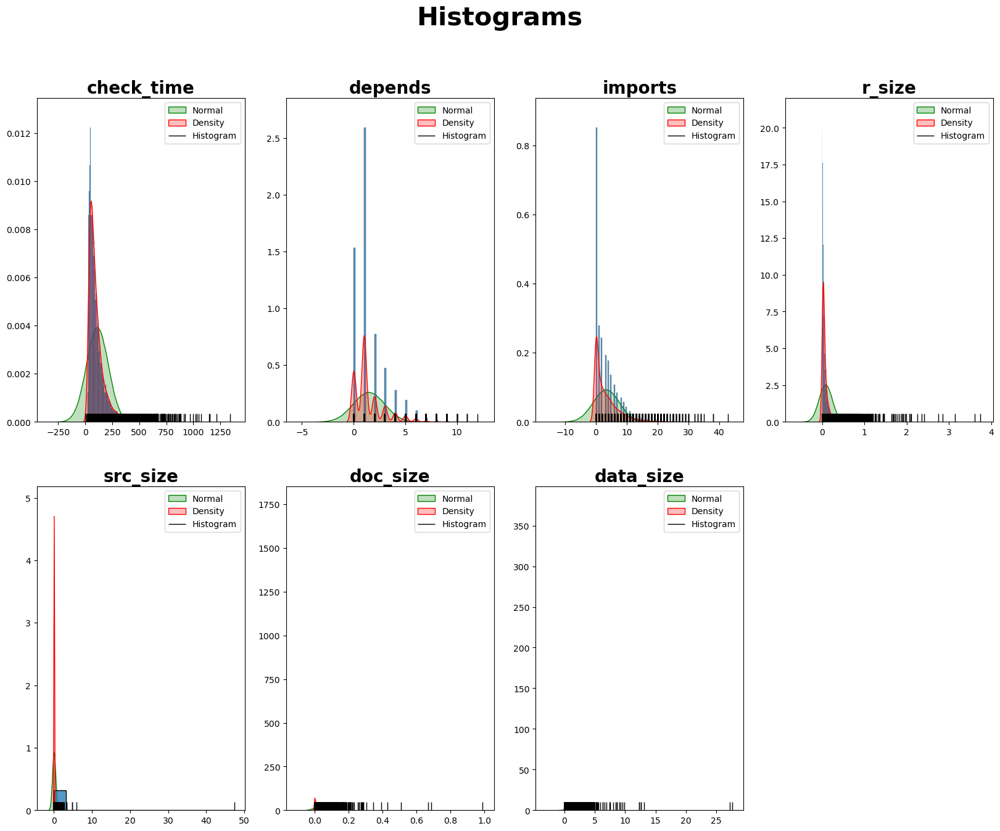

In [29]:
fig =  mosaic_hist(
            data=data,
            variables=col_dependent + col_num,
            figsize=(20,15),
            ncols= 4,
            title_fontsize=20
        )
fig[0].suptitle('Histograms', fontsize=30, fontweight='bold')

From the Q-Q plots we can see that most variable plotted do not have observations which follow a normal distribution. 
We also notice a number of outliers. From the histogram and density plots we observe that for most variables, the observations are highly concentrated around the mean. The observations also exhibit high levels of positive skewness.
It makes sense to choose only those variables selected using boruta and check the plots of the filtered variables.

#### Q-Q plots, Histogram and Density plots of filtered and untransformed variables

Text(0.5, 0.98, 'Quantile-Quantile Plots')

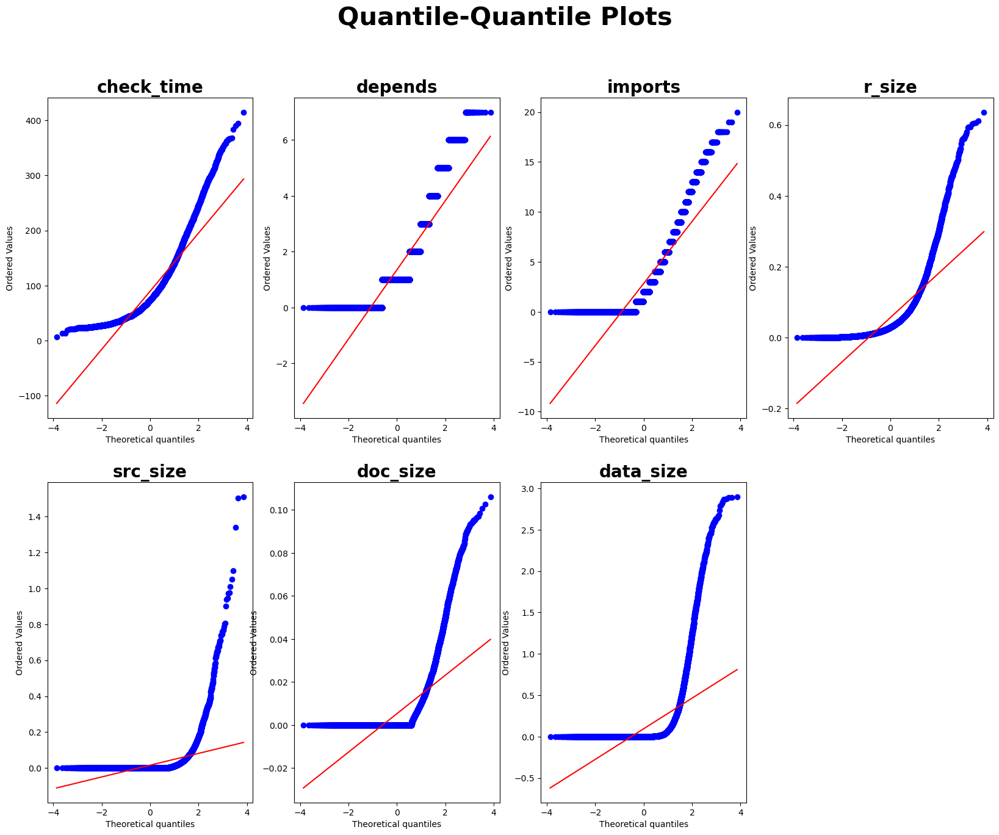

In [30]:
fig =  mosaic_qq(
            data=data_filtered,
            variables=col_dependent + col_num,
            figsize=(20,15),
            ncols= 4,
            title_fontsize=20
        )
fig[0].suptitle('Quantile-Quantile Plots', fontsize=30, fontweight='bold')

Text(0.5, 0.98, 'Histograms')

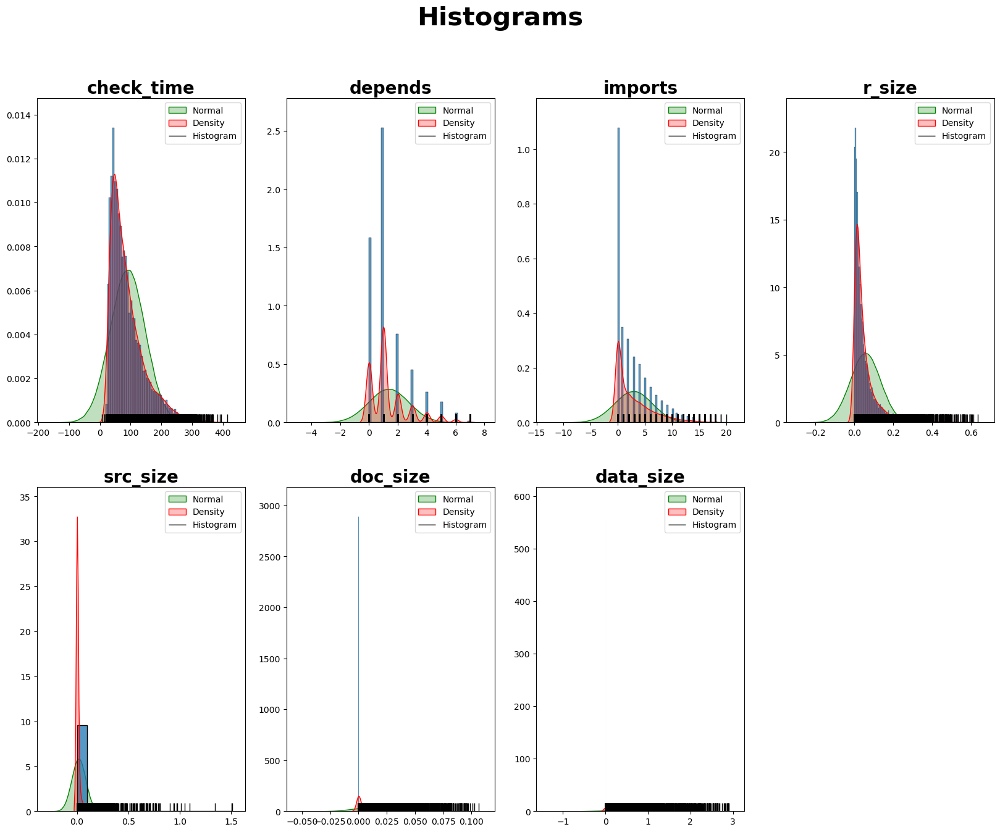

In [31]:
fig =  mosaic_hist(
            data=data_filtered,
            variables=col_dependent + col_num,
            figsize=(20,15),
            ncols= 4,
            title_fontsize=20
        )
fig[0].suptitle('Histograms', fontsize=30, fontweight='bold')

We plot the Q-Q plots for numeric variables selected using Boruta. 
Here we have fewer influential observations, which could be potential outliers. 
From the histogram and density plot we can see that although the problem of high positive skewness persists, at least now we have the data more or less uniformly distributed.
This is evident form the rugplots.

#### Q-Q plots, Histogram and Density plots of filtered and transformed variables

Text(0.5, 0.98, 'Quantile-Quantile Plots')

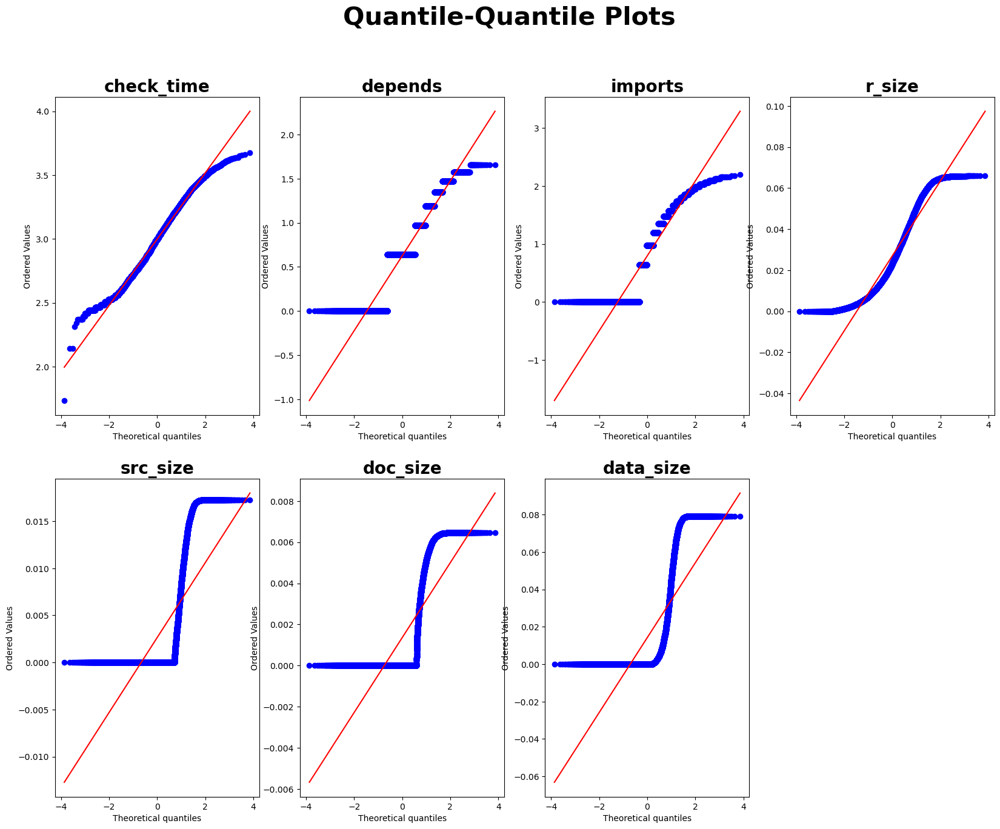

In [32]:
fig =  mosaic_qq(
            data=data_yeo_filtered,
            variables=col_dependent + col_num,
            figsize=(20,15),
            ncols= 4,
            title_fontsize=20
        )
fig[0].suptitle('Quantile-Quantile Plots', fontsize=30, fontweight='bold')

Text(0.5, 0.98, 'Histograms')

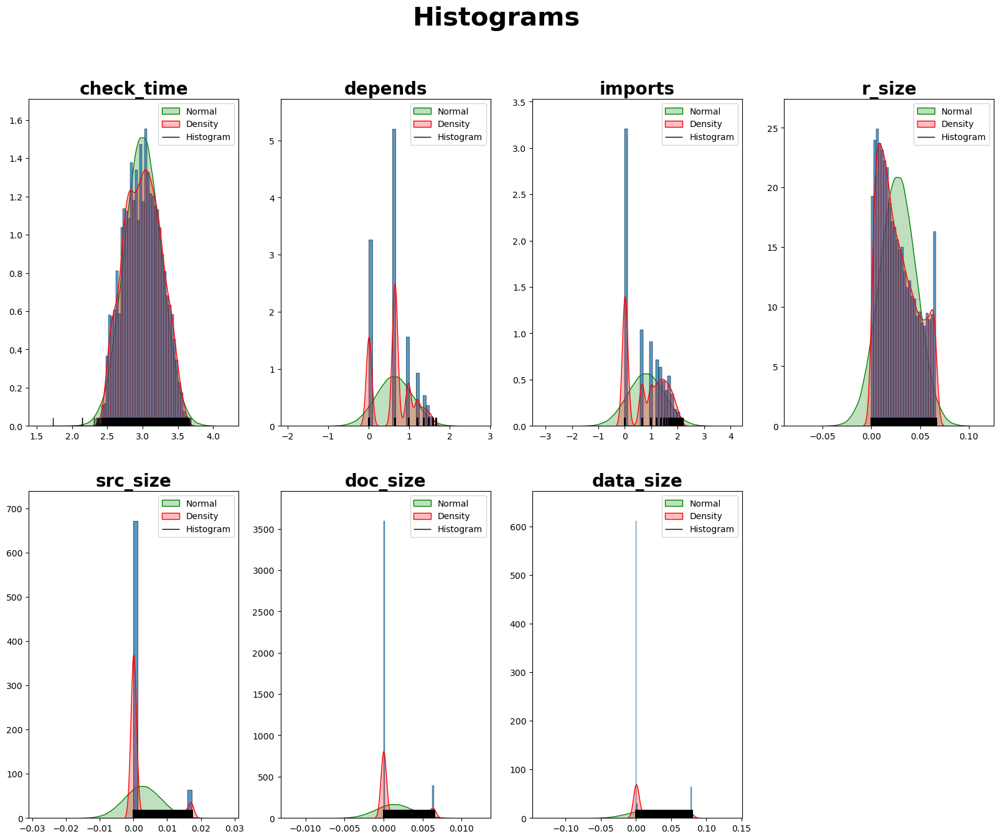

In [33]:
fig =  mosaic_hist(
            data=data_yeo_filtered,
            variables=col_dependent + col_num,
            figsize=(20,15),
            ncols= 4,
            title_fontsize=20
        )
fig[0].suptitle('Histograms', fontsize=30, fontweight='bold')

Now we solve the problem of high positive skewness by using optimal Yeo-Johnson transformation and the parameter (λ) for the variables is discussed in the respective transformation sections.

<h2 id="correlation-and-pairplots">Correlation and Pairplots</h2>


<a href="#index">Return to Index</a>

Classifying using `Roxygen`

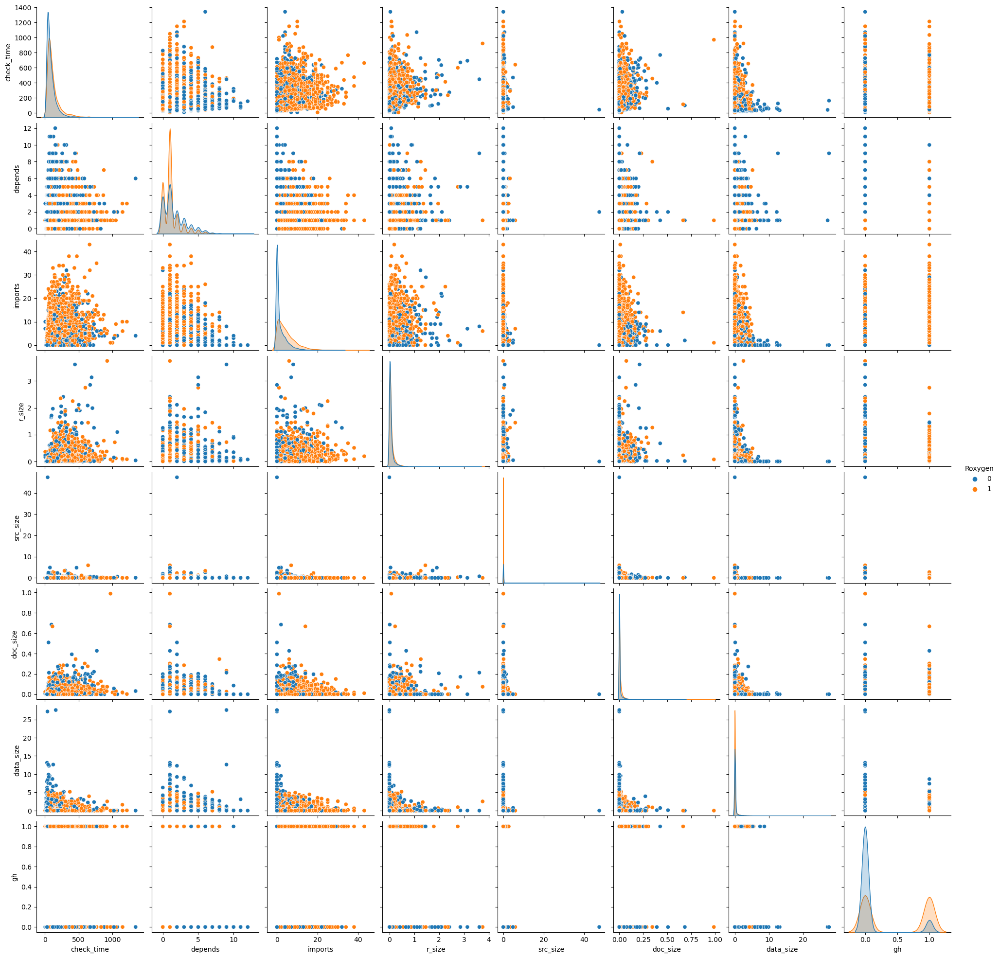

In [34]:
sns.pairplot(data, hue='Roxygen')
plt.show()

Classifying using `gh`

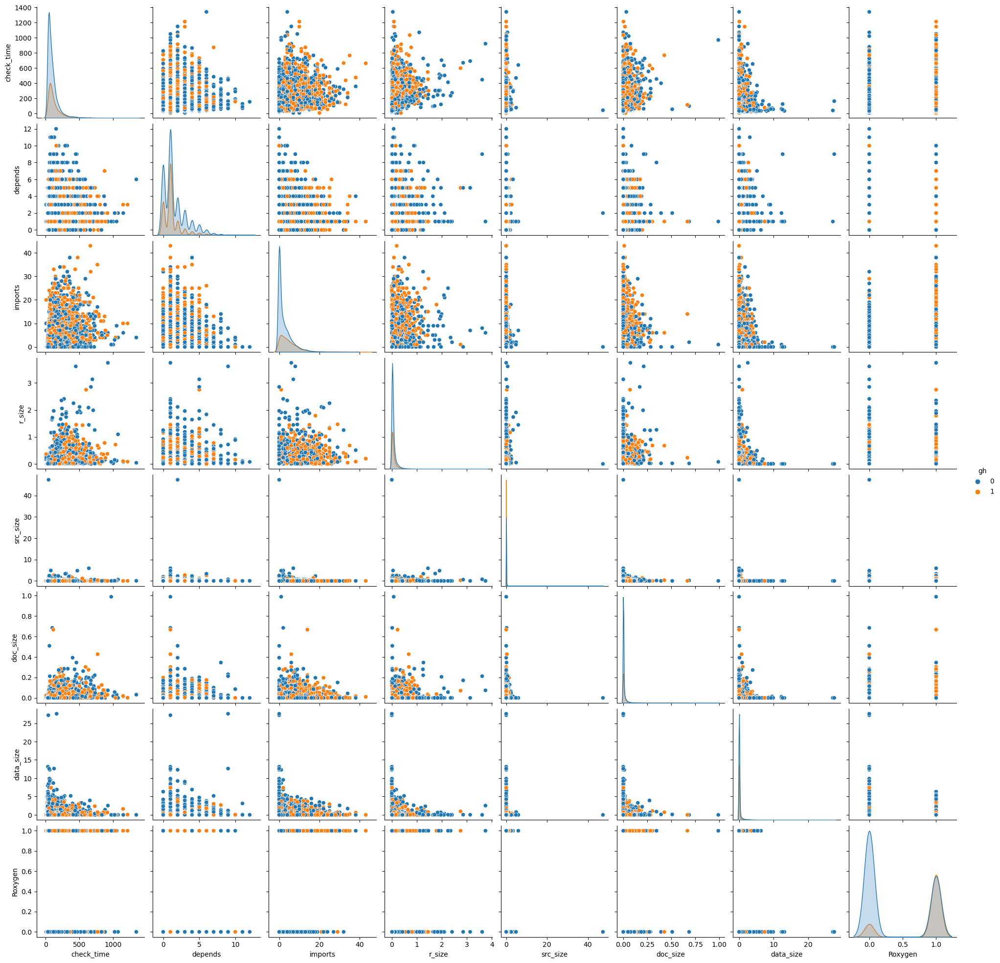

In [35]:
sns.pairplot(data, hue='gh')
plt.show()

Considering both Pairplots with caegorical variables "Roxygen" and "gh". We noticed that Variables doc_size and src_size show a right-skewed distribution. A log transformation may be used to reduce skewness and make the data more normally distributed, which is important for our statistical analysis that assumes normality.

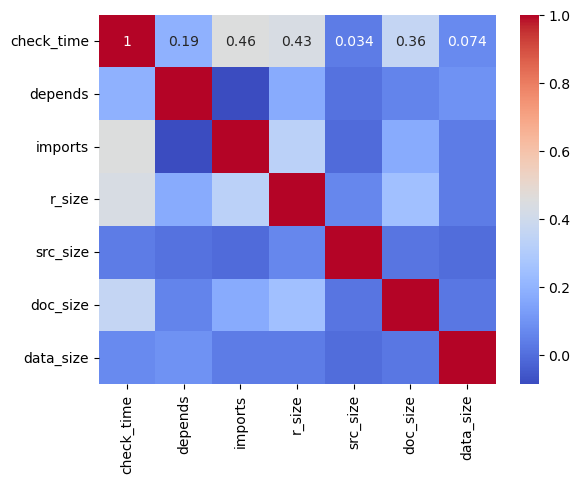

In [36]:
corr_matrix = data[col_dependent + col_num].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()

Based on the Correlation matrix above, we notice that the strongest correlation with the dependent variable "Check_time" is with the independent variable "imports" as well as "r_size".

In addition, we notice that there is no evidence of mulitcollinearity as there are no strong correlations between independent variables. The somewhat suspicious correlation is r_size and imports.

In [37]:
df = data.copy()
df['log_src_size'] = np.log(df['src_size'] + 1)
df['log_doc_size'] = np.log(df['doc_size'] + 1)

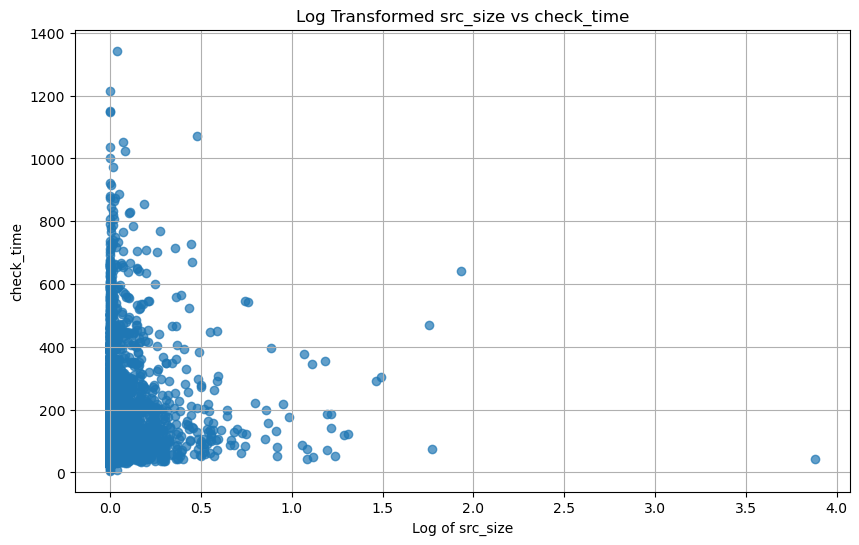

In [38]:
plt.figure(figsize=(10, 6))
plt.scatter(df['log_src_size'], df['check_time'], alpha=0.7) 
plt.title('Log Transformed src_size vs check_time')
plt.xlabel('Log of src_size')
plt.ylabel('check_time')
plt.grid(True)
plt.show()

There is a dense concentration of data points towards the lower end of the log_src_size axis, indicating that most of the src_size values are small to moderate in size after log transformation.

some potential outliers, particularly in the check_time, where some values are much higher than the rest. These could represent unusually large check times that may need to be investigated further.

There does not appear to be a clear linear relationship between log_src_size and check_time across the entire range of data, suggesting that the size of the source code may not be a direct or sole predictor of check time. 

While there is a slight increase in check_time as log_src_size increases, especially for values of log_src_size less than 1, the correlation does not seem strong, and there's a lot of dispersion in the data points.

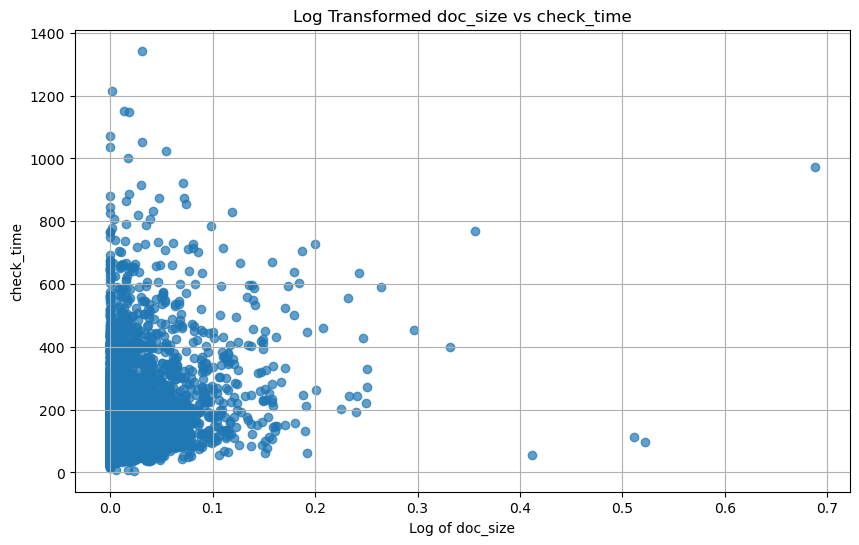

In [39]:
plt.figure(figsize=(10, 6))
plt.scatter(df['log_doc_size'], df['check_time'], alpha=0.7) 
plt.title('Log Transformed doc_size vs check_time')
plt.xlabel('Log of doc_size')
plt.ylabel('check_time')
plt.grid(True)
plt.show()

Similar to the previous plot, there is a significant concentration of data points at the lower end of the log_doc_size axis, suggesting that most documentation sizes are small when transformed logarithmically.

There are potential outliers in check_time, particularly for some values that are extremely high compared to the rest. These outliers could be due to special cases or errors in the data and may warrant further investigation.

There doesn't appear to be a strong correlation between log_doc_size and check_time, as the points do not form a clear trend.

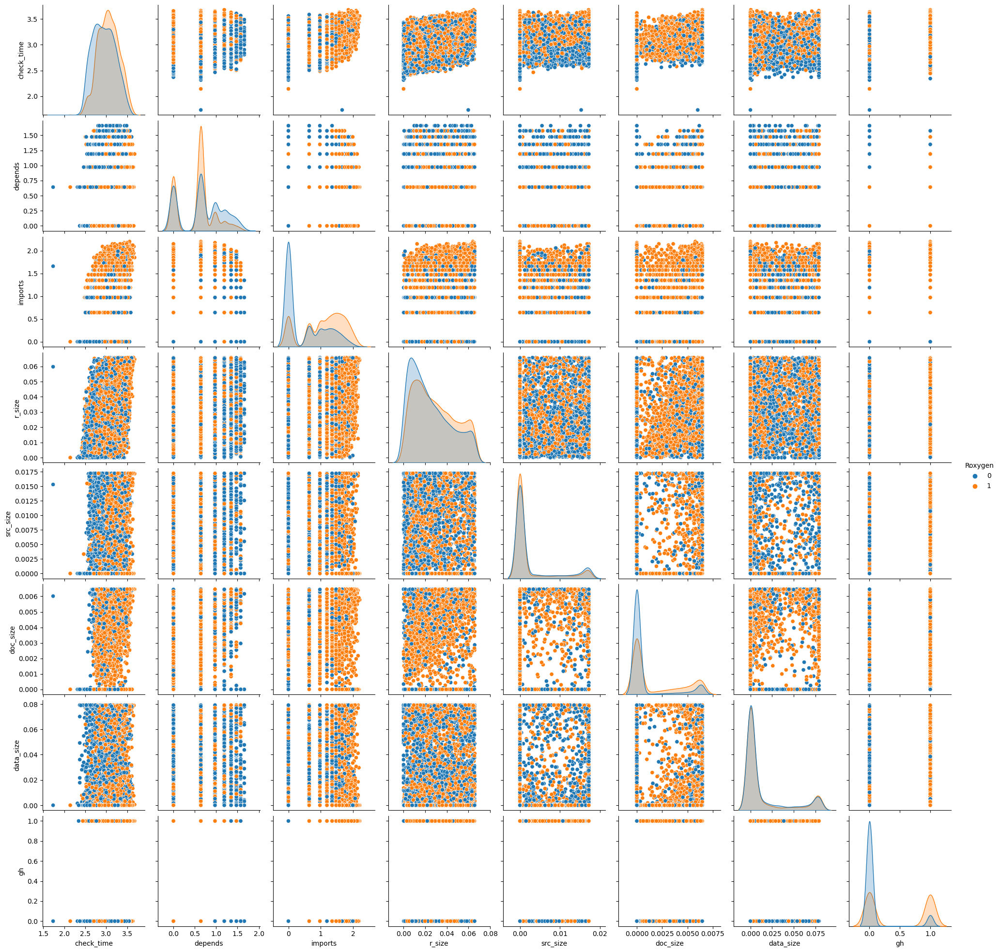

In [40]:

sns.pairplot(data_yeo_filtered, hue='Roxygen')
plt.show()

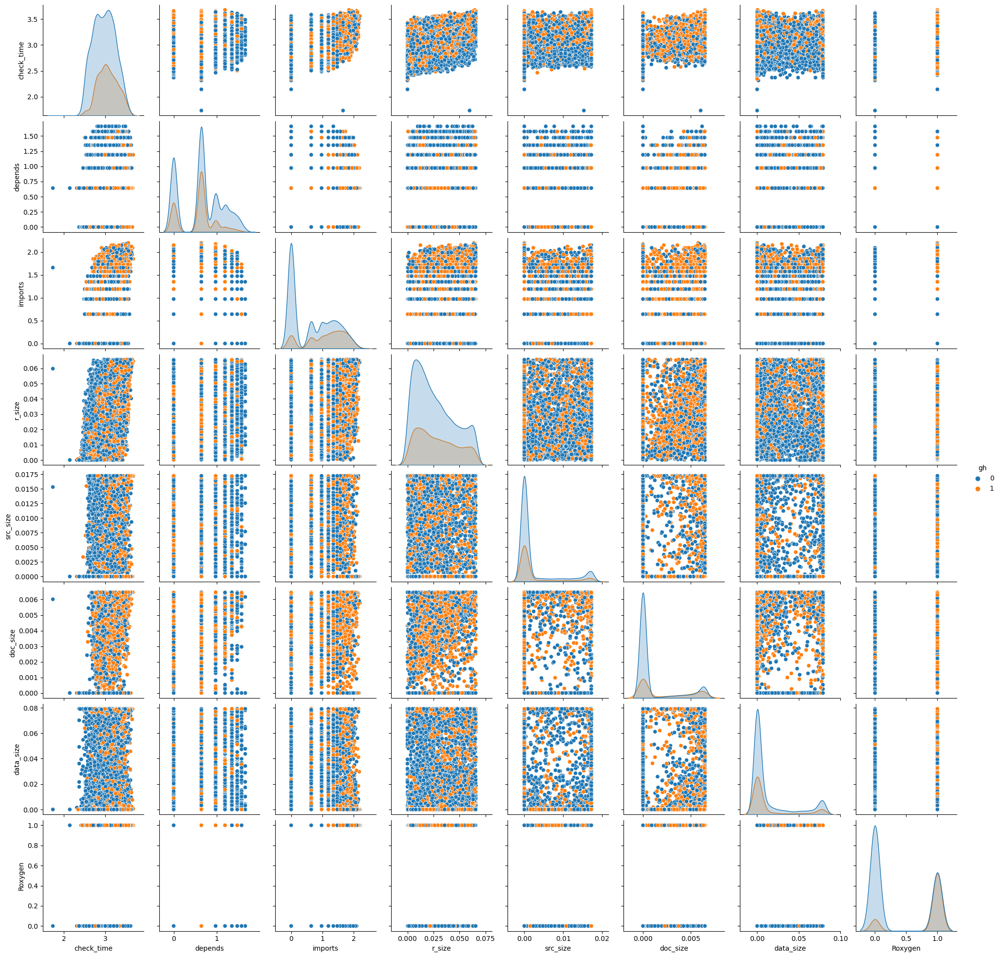

'\nIt can be noted that the Yeo-Johnson transformation on the data without unusual observations presents the strongest linear relationship with the dependent variable. Additionally, the correlations of the transformed independent variables are very weak, which minimizes the risk of multicollinearity.\n\n'

In [41]:
sns.pairplot(data_yeo_filtered, hue='gh')
plt.show()

## %% [markdown]
"""
It can be noted that the Yeo-Johnson transformation on the data without unusual observations presents the strongest linear relationship with the dependent variable. Additionally, the correlations of the transformed independent variables are very weak, which minimizes the risk of multicollinearity.

"""


---

<h1 id="model-selection">Model Selection</h1>
<a href="#index">Return to Index</a>

<h2 id="comparison-between-feasible-models">Comparison Between Feasible Models</h2>


<a href="#index">Return to Index</a>

A comparison is proposed between three different models:
- Model with untransformed variables.
- Model with optimal Yeo-Johnson transformation for each variable.
- Model with selected transformation for each variable.

The models will be estimated using FGLS to control for heteroskedasticity, VIF values will be examined to control for multicollinearity, and the Ramsey RESET test will be performed to control for model misspecification. Subsequently, the addition of quadratic and interaction terms will be evaluated to improve the model specification. Finally, a model will be selected based on its explanatory power and information criteria. The adjusted R-squared will be calculated using bootstrapping in order to generate a confidence interval for it.

<h3 id="model-with-untransformed-variables">Model with Untransformed Variables</h3>


<a href="#index">Return to Index</a>

<h4 id="least-squares-regression">Least Squares Regression</h4>

In [42]:
# ----- Design matrix and dependent variable -----
Y_1 = data_filtered[col_dependent].copy()
X_1 = data_filtered[col_independent].copy()
X_1 = sm.add_constant(X_1)

In [43]:
model_ols_1 = sm.OLS(
    Y_1, X_1
).fit(cov_type='HC1')
model_ols_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.492
Model:                            OLS   Adj. R-squared:                  0.492
Method:                 Least Squares   F-statistic:                     922.1
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:22:49   Log-Likelihood:                -62932.
No. Observations:               12295   AIC:                         1.259e+05
Df Residuals:                   12286   BIC:                         1.259e+05
Df Model:                           8                                         
Covariance Type:                  HC1                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         39.3018      0.609     64.535      0.000      38.108      40.495
depends       10.0186      0.285     35.094      0.000       9.459      10.578
imports        6.8689      0.156     44.048      0.000       6.563       7.175
r_size       163.5467      6.918     23.641      0.000     149.988     177.105
src_size      80.3633      8.044      9.991      0.000      64.598      96.128
doc_size     983.9910     43.442     22.651      0.000     898.846    1069.136
data_size      7.3543      1.289      5.708      0.000       4.829       9.880
Roxygen        1.8837      0.823      2.289      0.022       0.271       3.497
gh             1.2289      0.943      1.304      0.192      -0.619       3.076
==============================================================================
Omnibus:                     2454.426   Durbin-Watson:                   1.877
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             5458.411
Skew:                           1.148   Prob(JB):                         0.00
Kurtosis:                       5.321   Cond. No.                         373.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

<h4 id="feasible-generalized-least-squares-regression">Feasible Generalized Least Squares Regression</h4>

In [44]:
weights_1 = FGLS_weights(Y_1, X_1, cov_type='HC1')

In [45]:
model_fgls_1 = sm.WLS(
    Y_1, X_1,
    weights=weights_1
).fit(cov_type='HC1')

model_fgls_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.408
Model:                            WLS   Adj. R-squared:                  0.408
Method:                 Least Squares   F-statistic:                     1275.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:22:49   Log-Likelihood:                -61706.
No. Observations:               12295   AIC:                         1.234e+05
Df Residuals:                   12286   BIC:                         1.235e+05
Df Model:                           8                                         
Covariance Type:                  HC1                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         37.5303      0.453     82.917      0.000      36.643      38.417
depends        9.8207      0.256     38.410      0.000       9.320      10.322
imports        7.3177      0.146     50.274      0.000       7.032       7.603
r_size       170.3872      6.704     25.416      0.000     157.248     183.526
src_size     119.1470      7.928     15.029      0.000     103.609     134.685
doc_size    1079.4136     44.123     24.464      0.000     992.935    1165.893
data_size      4.7926      1.031      4.649      0.000       2.772       6.813
Roxygen        2.0608      0.681      3.026      0.002       0.726       3.396
gh             1.7208      0.786      2.190      0.028       0.181       3.260
==============================================================================
Omnibus:                     3742.429   Durbin-Watson:                   1.865
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            11812.123
Skew:                           1.563   Prob(JB):                         0.00
Kurtosis:                       6.645   Cond. No.                         405.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

In [46]:
VIF_results_1 = VIF_X(X_1)

╔═════════════════════════════════════════════╗
║ ----- Variance Inflation Factor (VIF) ----- ║
╚═════════════════════════════════════════════╝
    Variable       VIF
0      const  3.867632
1    depends  1.104074
2    imports  1.398769
3     r_size  1.289416
4   src_size  1.025660
5   doc_size  1.102063
6  data_size  1.015635
7    Roxygen  1.364735
8         gh  1.258534


In [47]:
reset_results_1 = ramsey_reset_test(model_fgls_1, order=2)

╔═══════════════════════════════╗
║ ----- Ramsey RESET Test ----- ║
╚═══════════════════════════════╝

        H0: gamma = 0 (Model is correctly specified.)
        ----------------------
        Power Tested = 2
        ----------------------
        p-value = 0.0 % 🔴
        ----------------------
        


It is noticeable that there is no substantial difference between the OLS and FGLS estimations. The latter procedure is preferable because it controls the problem of heteroscedasticity. We can observe that this model does not have a significant problem with multicollinearity, as the VIF values are less than 10. However, the model presents specification issues, as the Ramsey test indicates the need to include quadratic terms and interactions.

Next, the inclusion of all possible pairs of quadratic and interaction terms is tested to identify which of these terms are significant. For this purpose, the Ramsey test is used for each of the possible combinations of terms.

In [48]:
# ----- Iterative test for omitted variables -----
omitted_results_1, X_extended_1 = iterative_reset_omitted(
    Y_1, X_1,
    degree = 2,
    subset_size = 2,
    verbose = True
)
omitted_results_1.loc[omitted_results_1.pvalue_pct > 5]

╔═══════════════════════════════════════════╗
║ ----- Omitted Variables Exploration ----- ║
╚═══════════════════════════════════════════╝

            The following table shows the p-values (%)
            of the Ramsey RESET test, adding each 
            combination (size: 2) of the
            omitted variables to the model.
            ----------------------
            
                                 variables  pvalue_pct
258                  [imports^2, r_size^2]       75.57
264                [imports^2, src_size^2]       47.55
269                [imports^2, doc_size^2]       30.12
74             [depends r_size, imports^2]        4.87
430                 [r_size^2, doc_size^2]        3.22
..                                     ...         ...
212    [depends Roxygen, src_size Roxygen]        0.00
213         [depends Roxygen, src_size gh]        0.00
214          [depends Roxygen, doc_size^2]        0.00
215  [depends Roxygen, doc_size data_size]        0.00
629              

,variables,pvalue_pct
258,"[imports^2, r_size^2]",75.57
264,"[imports^2, src_size^2]",47.55
269,"[imports^2, doc_size^2]",30.12


From the previous analysis, it is clear that the better-specified model is the one that includes the terms `imports^2` and `r_size^2`. Therefore, these terms are included in the model.

In [49]:
# ----- Adding the variables to the design matrix -----
add_variables_1 = [
    'imports^2',
    'r_size^2'
]
X_with_omitted_1 = X_1.copy()
X_with_omitted_1[add_variables_1] = X_extended_1[add_variables_1]

In [50]:
model_ols_ommited_1 = sm.OLS(
    Y_1, X_with_omitted_1
).fit(cov_type='HC1')
# ----- FGLS regression -----
weights_with_omitted_1 = FGLS_weights(Y_1, X_with_omitted_1, cov_type='HC1')
model_fgls_with_omitted_1 = sm.WLS(
    Y_1, X_with_omitted_1,
    weights=weights_with_omitted_1
).fit(cov_type='HC1')
model_fgls_with_omitted_1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.423
Model:                            WLS   Adj. R-squared:                  0.423
Method:                 Least Squares   F-statistic:                     1072.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:23:14   Log-Likelihood:                -61582.
No. Observations:               12295   AIC:                         1.232e+05
Df Residuals:                   12284   BIC:                         1.233e+05
Df Model:                          10                                         
Covariance Type:                  HC1                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         35.1078      0.466     75.324      0.000      34.194      36.021
depends        9.8151      0.258     38.115      0.000       9.310      10.320
imports        9.3740      0.297     31.613      0.000       8.793       9.955
r_size       241.3971     12.985     18.590      0.000     215.946     266.848
src_size     109.3891      7.632     14.334      0.000      94.431     124.347
doc_size    1047.3170     45.487     23.024      0.000     958.163    1136.471
data_size      4.2388      1.008      4.206      0.000       2.264       6.214
Roxygen        1.3004      0.675      1.927      0.054      -0.022       2.623
gh             2.1619      0.781      2.767      0.006       0.631       3.693
imports^2     -0.2587      0.028     -9.097      0.000      -0.314      -0.203
r_size^2    -235.6448     36.560     -6.446      0.000    -307.300    -163.989
==============================================================================
Omnibus:                     4084.130   Durbin-Watson:                   1.864
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            15462.612
Skew:                           1.636   Prob(JB):                         0.00
Kurtosis:                       7.414   Cond. No.                     3.38e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The condition number is large, 3.38e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [51]:
reset_results_1 = ramsey_reset_test(model_fgls_with_omitted_1, order=2)

╔═══════════════════════════════╗
║ ----- Ramsey RESET Test ----- ║
╚═══════════════════════════════╝

        H0: gamma = 0 (Model is correctly specified.)
        ----------------------
        Power Tested = 2
        ----------------------
        p-value = 76.0 % 🟢
        ----------------------
        


In [52]:
VIF_results_1 = VIF_X(X_with_omitted_1)

╔═════════════════════════════════════════════╗
║ ----- Variance Inflation Factor (VIF) ----- ║
╚═════════════════════════════════════════════╝
     Variable       VIF
0       const  4.550707
1     depends  1.139083
2     imports  7.830967
3      r_size  7.069305
4    src_size  1.028342
5    doc_size  1.126342
6   data_size  1.015848
7     Roxygen  1.388094
8          gh  1.262804
9   imports^2  6.882761
10   r_size^2  6.143892


In [53]:
het_results_1 = het_breuschpagan(model_fgls_with_omitted_1)

╔════════════════════════════════╗
║ ----- Breusch-Pagan Test ----- ║
╚════════════════════════════════╝

        H0: alpha_1 = ... = alpha_k = 0 (Model is Homoscedastic.)
        ----------------------
        p-value = 0.0 % 🔴
        ----------------------
        


It can be observed that the inclusion of quadratic terms improves the model's specification. The new estimation with FGLS shows high significance for all parameters, but the quadratic terms have a high VIF value, indicating that the addition of these terms increases the possibility of multicollinearity. Regarding heteroscedasticity, the Breusch-Pagan test indicates that the model has heteroscedasticity issues, but this is corrected with the use of FGLS.

In [54]:
# ----- Bootstrap Estimation -----
boot_results_1, b_conf_int_1 = bootstrap_estimation(X_with_omitted_1, Y_1, fgls=True, n_boots=1000, cov_type='HC1')

╔════════════════════════════════════════════════╗
║ ----- 95% Bootstrap Confidence Intervals ----- ║
╚════════════════════════════════════════════════╝
1000 Simulations
════════════════
                    mean          lower          upper
const          35.141996      34.179903      36.110397
depends         9.798685       9.266942      10.268729
imports         9.373002       8.771379       9.929787
r_size        240.891623     213.700890     269.314949
src_size      108.011695      83.391971     135.497417
doc_size     1051.425103     952.470441    1152.209829
data_size       4.252225       2.074844       6.714025
Roxygen         1.268836      -0.032603       2.576135
gh              2.187552       0.693732       3.653748
imports^2      -0.258215      -0.308286      -0.204601
r_size^2     -234.179362    -307.445586    -156.127659
R2              0.425386       0.409074       0.442956
adjR2           0.424918       0.408593       0.442502
sigma           4.049853       3.900144    

In [55]:
# ----- Cross Validation -----

scores_1 = cross_validation(X_with_omitted_1, Y_1, nfolds = 5, test_size = 0.3, verbose = True)

╔══════════════════════════════╗
║ ----- Cross Validation ----- ║
╚══════════════════════════════╝
 C.V. Parameters
╭───────────────
├ Test Size: 30.0 %
├ N. Folds: 5
├ Amount of data for Testing: 3689
├ Amount of data for Training: 8606
╰ Amount of data per fold: 1721.2


        ----- General Performance -----
        MAE: 29.282271340794125
        MSE: 1622.04713483731
        RMSE: 40.274646303069005
        
        ----- RMSE per Fold -----
        [40.7445821  40.84671582 37.69279793 41.0132338  41.20996058]
        ------------------------------
        Average RMSE: 40.30145804496309
        


To enhance the comparison, the model is evaluated by calculating its respective parameters through bootstrapping, computing the 95% confidence intervals for information criteria and the adjusted R-squared. Additionally, the average RMSE is calculated using cross-validation.

<h4 id="cooks-distance-and-residuals-analysis">Cooks Distance and Residuals Analysis</h4>
<a href="#index">Return to Index</a>

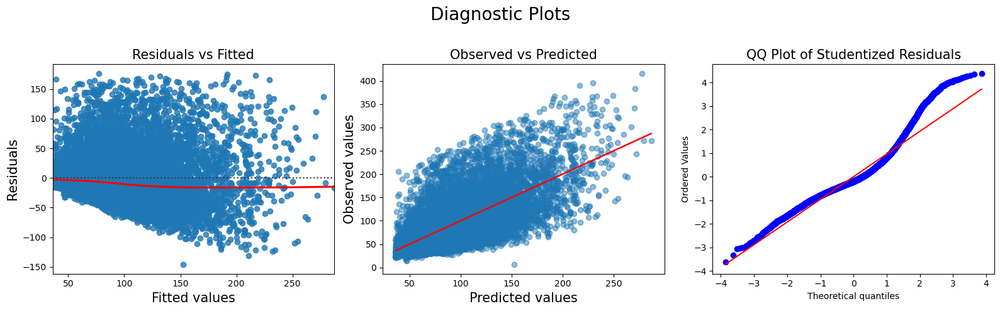

In [56]:
plot_diagnostic_plots(model_ols_ommited_1)

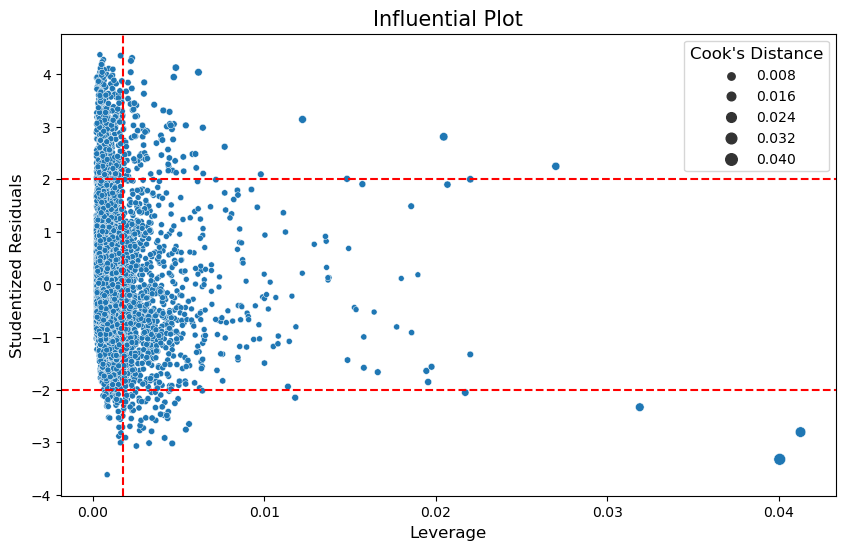

In [57]:
influential_plot(model_ols_ommited_1)

From the analysis of the residuals, it can be observed that the relationship is linear. The residuals deviate from normality as a consequence of the increasing variance of the residuals.

<h3 id="model-with-optimal-yeo-johnson-transformation-for-each-variable">Model With Optimal Yeo-Johnson Transformation for each Variable</h3>
<a href="#index">Return to Index</a>

<h4 id="least-squares-regression">Least Squares Regression</h4>

In [58]:
# ----- Design matrix and dependent variable -----
Y_2 = data_yeo_filtered[col_dependent].copy()
X_2 = data_yeo_filtered[col_independent].copy()
X_2 = sm.add_constant(X_2)

In [59]:
model_ols_2 = sm.OLS(
    Y_2, X_2
).fit(cov_type='HC1')
model_ols_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.556
Model:                            OLS   Adj. R-squared:                  0.556
Method:                 Least Squares   F-statistic:                     2264.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:23:49   Log-Likelihood:                 4068.5
No. Observations:               12295   AIC:                            -8119.
Df Residuals:                   12286   BIC:                            -8052.
Df Model:                           8                                         
Covariance Type:                  HC1                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.6248      0.004    736.709      0.000       2.618       2.632
depends        0.1552      0.004     41.476      0.000       0.148       0.163
imports        0.1549      0.003     55.414      0.000       0.149       0.160
r_size         3.4092      0.097     35.221      0.000       3.219       3.599
src_size       9.4106      0.277     34.014      0.000       8.868       9.953
doc_size      20.2757      0.720     28.146      0.000      18.864      21.688
data_size      0.5230      0.061      8.562      0.000       0.403       0.643
Roxygen        0.0010      0.004      0.277      0.782      -0.006       0.008
gh             0.0006      0.004      0.153      0.879      -0.007       0.008
==============================================================================
Omnibus:                      226.922   Durbin-Watson:                   1.890
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              330.087
Skew:                           0.212   Prob(JB):                     2.10e-72
Kurtosis:                       3.681   Cond. No.                         741.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

<h4 id="feasible-generalized-least-squares-regression">Feasible Generalized Least Squares Regression</h4>

In [60]:
weights_2 = FGLS_weights(Y_2, X_2, cov_type='HC1')

In [61]:
model_fgls_2 = sm.WLS(
    Y_2, X_2,
    weights=weights_2
).fit(cov_type='HC1')

model_fgls_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.566
Model:                            WLS   Adj. R-squared:                  0.566
Method:                 Least Squares   F-statistic:                     2258.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:23:49   Log-Likelihood:                 4118.3
No. Observations:               12295   AIC:                            -8219.
Df Residuals:                   12286   BIC:                            -8152.
Df Model:                           8                                         
Covariance Type:                  HC1                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.6287      0.004    735.689      0.000       2.622       2.636
depends        0.1473      0.004     39.194      0.000       0.140       0.155
imports        0.1519      0.003     54.226      0.000       0.146       0.157
r_size         3.4675      0.097     35.905      0.000       3.278       3.657
src_size       9.4950      0.271     35.055      0.000       8.964      10.026
doc_size      19.8657      0.710     27.985      0.000      18.474      21.257
data_size      0.5322      0.060      8.923      0.000       0.415       0.649
Roxygen        0.0036      0.004      0.955      0.340      -0.004       0.011
gh             0.0026      0.004      0.681      0.496      -0.005       0.010
==============================================================================
Omnibus:                      195.686   Durbin-Watson:                   1.889
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              253.894
Skew:                           0.222   Prob(JB):                     7.37e-56
Kurtosis:                       3.546   Cond. No.                         758.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

In [62]:
VIF_results_2 = VIF_X(X_2)

╔═════════════════════════════════════════════╗
║ ----- Variance Inflation Factor (VIF) ----- ║
╚═════════════════════════════════════════════╝
    Variable       VIF
0      const  5.799192
1    depends  1.161477
2    imports  1.521494
3     r_size  1.362958
4   src_size  1.022848
5   doc_size  1.162946
6  data_size  1.072201
7    Roxygen  1.420456
8         gh  1.280318


In [63]:
reset_results_2 = ramsey_reset_test(model_fgls_2, order=2)

╔═══════════════════════════════╗
║ ----- Ramsey RESET Test ----- ║
╚═══════════════════════════════╝

        H0: gamma = 0 (Model is correctly specified.)
        ----------------------
        Power Tested = 2
        ----------------------
        p-value = 0.0 % 🔴
        ----------------------
        


It is noticeable that there is no substantial difference between the OLS and FGLS estimations. In this model, the categorical variables do not appear to have explanatory power.

In [64]:
# ----- Iterative test for omitted variables -----
omitted_results_2, X_extended_2 = iterative_reset_omitted(
    Y_2, X_2,
    degree = 2,
    subset_size = 2,
    verbose = True
)
omitted_results_2.loc[omitted_results_2.pvalue_pct > 5]

╔═══════════════════════════════════════════╗
║ ----- Omitted Variables Exploration ----- ║
╚═══════════════════════════════════════════╝

            The following table shows the p-values (%)
            of the Ramsey RESET test, adding each 
            combination (size: 2) of the
            omitted variables to the model.
            ----------------------
            
                                variables  pvalue_pct
49     [depends imports, r_size src_size]       94.96
44    [depends imports, imports doc_size]       38.46
50     [depends imports, r_size doc_size]       18.29
36    [depends imports, depends src_size]       15.04
55   [depends imports, src_size doc_size]        0.47
..                                    ...         ...
230              [depends gh, imports gh]        0.00
231                [depends gh, r_size^2]        0.00
232         [depends gh, r_size src_size]        0.00
233         [depends gh, r_size doc_size]        0.00
629                    [Roxy

,variables,pvalue_pct
49,"[depends imports, r_size src_size]",94.96
44,"[depends imports, imports doc_size]",38.46
50,"[depends imports, r_size doc_size]",18.29
36,"[depends imports, depends src_size]",15.04


From the previous analysis, it is clear that the better-specified model is the one that includes the terms of interaction `depends imports` and `_size src_size`. Therefore, these terms are included in the model. The terms make sense, as the inclusion of more dependencies should increase the number of imported packages. Similarly, the total size of the package increases when more files are included in the `src` directory.

In [65]:
# ----- Adding the variables to the design matrix -----
add_variables_2 = [
    'depends imports',
    'r_size src_size'
]
X_with_imitted_2 = X_2.copy()
X_with_imitted_2[add_variables_2] = X_extended_2[add_variables_2]

In [66]:
model_ols_ommited_2 = sm.OLS(
    Y_2, X_with_imitted_2
).fit(cov_type='HC1')
# ----- FGLS regression -----
weights_with_omitted_2 = FGLS_weights(Y_2, X_with_imitted_2, cov_type='HC1')
models_fgls_with_ommited_2 = sm.WLS(
    Y_2, X_with_imitted_2,
    weights=weights_with_omitted_2
).fit(cov_type='HC1')
models_fgls_with_ommited_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.599
Model:                            WLS   Adj. R-squared:                  0.599
Method:                 Least Squares   F-statistic:                     1931.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:24:15   Log-Likelihood:                 4314.1
No. Observations:               12295   AIC:                            -8606.
Df Residuals:                   12284   BIC:                            -8525.
Df Model:                          10                                         
Covariance Type:                  HC1                                         
===================================================================================
                      coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------
const               2.5833      0.004    609.559      0.000       2.575       2.592
depends             0.1918      0.005     39.052      0.000       0.182       0.201
imports             0.1976      0.004     45.378      0.000       0.189       0.206
r_size              3.8738      0.105     36.848      0.000       3.668       4.080
src_size           13.4998      0.505     26.749      0.000      12.511      14.489
doc_size           20.1527      0.708     28.467      0.000      18.765      21.540
data_size           0.5914      0.059      9.982      0.000       0.475       0.708
Roxygen             0.0031      0.004      0.836      0.403      -0.004       0.010
gh                  0.0046      0.004      1.236      0.217      -0.003       0.012
depends imports    -0.0711      0.005    -14.267      0.000      -0.081      -0.061
r_size src_size  -117.8712     12.911     -9.130      0.000    -143.175     -92.567
==============================================================================
Omnibus:                      284.020   Durbin-Watson:                   1.890
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              493.587
Skew:                           0.197   Prob(JB):                    6.59e-108
Kurtosis:                       3.899   Cond. No.                     1.51e+04
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The condition number is large, 1.51e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [67]:
reset_results_2 = ramsey_reset_test(models_fgls_with_ommited_2, order=2)

╔═══════════════════════════════╗
║ ----- Ramsey RESET Test ----- ║
╚═══════════════════════════════╝

        H0: gamma = 0 (Model is correctly specified.)
        ----------------------
        Power Tested = 2
        ----------------------
        p-value = 95.0 % 🟢
        ----------------------
        


In [68]:
VIF_results_2 = VIF_X(X_with_imitted_2)

╔═════════════════════════════════════════════╗
║ ----- Variance Inflation Factor (VIF) ----- ║
╚═════════════════════════════════════════════╝
           Variable       VIF
0             const  8.751397
1           depends  2.046919
2           imports  3.831080
3            r_size  1.628398
4          src_size  3.545039
5          doc_size  1.163542
6         data_size  1.076134
7           Roxygen  1.422062
8                gh  1.280361
9   depends imports  3.843587
10  r_size src_size  4.004711


In [69]:
het_results_2 = het_breuschpagan(models_fgls_with_ommited_2)

╔════════════════════════════════╗
║ ----- Breusch-Pagan Test ----- ║
╚════════════════════════════════╝

        H0: alpha_1 = ... = alpha_k = 0 (Model is Homoscedastic.)
        ----------------------
        p-value = 0.0 % 🔴
        ----------------------
        


It can be observed that the inclusion of quadratic terms improves the model's specification. The new estimation with FGLS shows high significance for all parameters except for the categorical variables. The interaction terms appear to be significant and do not seem to have a high variance inflation factor. Regarding heteroscedasticity, the Breusch-Pagan test indicates that the model has heteroscedasticity issues, but this is corrected with the use of FGLS.

In [70]:
# ----- Bootstrap Estimation -----
boot_results_2, b_conf_int_2 = bootstrap_estimation(X_with_imitted_2, Y_2, fgls=True, n_boots=1000, cov_type='HC1')

╔════════════════════════════════════════════════╗
║ ----- 95% Bootstrap Confidence Intervals ----- ║
╚════════════════════════════════════════════════╝
1000 Simulations
════════════════
                        mean        lower        upper
const               2.582977     2.575026     2.591584
depends             0.192291     0.182474     0.202651
imports             0.198006     0.188962     0.206767
r_size              3.869960     3.652041     4.064844
src_size           13.520707    12.539437    14.506548
doc_size           20.122933    18.738432    21.569188
data_size           0.588505     0.471291     0.710703
Roxygen             0.003007    -0.004751     0.010243
gh                  0.004661    -0.002431     0.011817
depends imports    -0.071293    -0.081703    -0.060536
r_size src_size  -118.275528  -143.619388   -93.667179
R2                  0.598362     0.582990     0.614730
adjR2               0.598035     0.582650     0.614416
sigma               3.399741     3.283878  

In [71]:
# ----- Cross Validation -----

scores_2 = cross_validation(X_with_imitted_2, Y_2, nfolds = 5, test_size = 0.3, verbose = True)

╔══════════════════════════════╗
║ ----- Cross Validation ----- ║
╚══════════════════════════════╝
 C.V. Parameters
╭───────────────
├ Test Size: 30.0 %
├ N. Folds: 5
├ Amount of data for Testing: 3689
├ Amount of data for Training: 8606
╰ Amount of data per fold: 1721.2


        ----- General Performance -----
        MAE: 0.13624465637324298
        MSE: 0.028721237206414993
        RMSE: 0.16947341150285194
        
        ----- RMSE per Fold -----
        [0.17561676 0.17330339 0.17259545 0.1696028  0.16782971]
        ------------------------------
        Average RMSE: 0.17178962300934517
        


To enhance the comparison, the model is evaluated by calculating its respective parameters through bootstrapping, computing the 95% confidence intervals for information criteria and the adjusted R-squared. Additionally, the average RMSE is calculated using cross-validation.

<h4 id="cooks-distance-and-residuals-analysis">Cooks Distance and Residuals Analysis</h4>
<a href="#index">Return to Index</a>

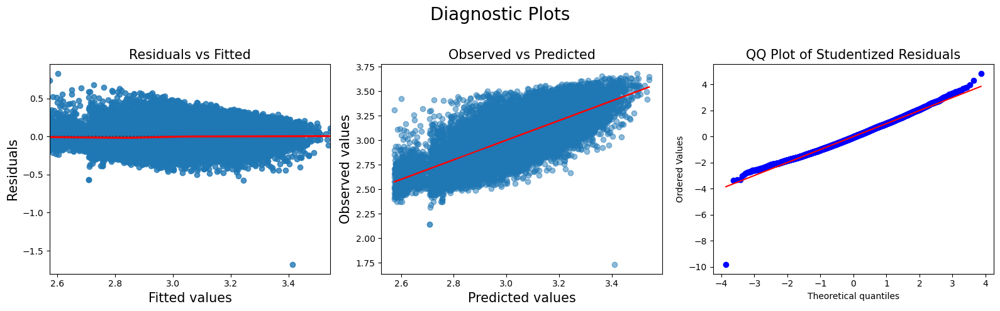

In [72]:
plot_diagnostic_plots(model_ols_ommited_2)

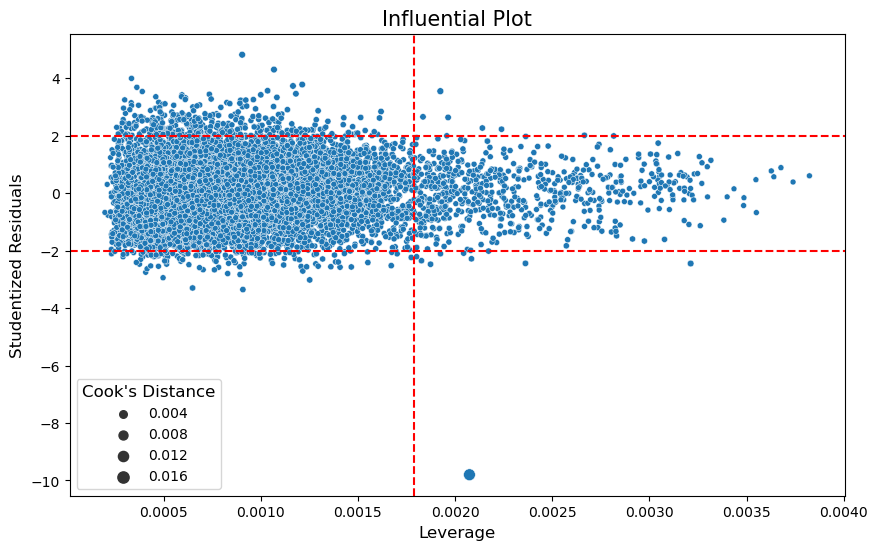

In [73]:
influential_plot(model_ols_ommited_2)

The model using Yeo-Johnson transformations shows an improvement in the model specification, enhancing the properties of the residuals. In this model, there is still the presence of heteroscedasticity, but it is corrected with the use of FGLS. The model shows a better fit than the previous one, as indicated by the value of the adjusted R-squared. The information criteria also indicate that this model is better than the previous one.

<h3 id="model-with-selected-transformation-for-each-variable">Model With Selected Transformation for each Variable</h3>
<a href="#index">Return to Index</a>

For this model, values of $\lambda$ that fall within the 95% confidence interval for each variable are selected. This is done with the aim of improving the interpretation of the parameters. Below are the selected values of $\lambda$ for each variable.

In [74]:
lmbd = pd.read_csv(
    os.path.join('data', 'lambda.csv'),
    index_col=0
)
lmbd.T

,lambda
check_time,0.0
depends,-0.2
imports,-0.2
r_size,-15.0
src_size,-55.0
doc_size,-150.0
data_size,-13.0


In [75]:
# ----- Transforming the variables -----
data_sy = data_filtered.copy()

In [76]:
for col in col_num + col_dependent:
    data_sy[col] = stats.yeojohnson(data_sy[col], lmbda=lmbd[col][0])

<h4 id="least-squares-regression">Least Squares Regression</h4>

In [77]:
# ----- Design matrix and dependent variable -----
Y_3 = data_sy[col_dependent].copy()
X_3 = data_sy[col_independent].copy()
X_3 = sm.add_constant(X_3)

In [78]:
model_ols_3 = sm.OLS(
    Y_3, X_3
).fit(cov_type='HC1')
model_ols_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.556
Model:                            OLS   Adj. R-squared:                  0.556
Method:                 Least Squares   F-statistic:                     2252.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:24:50   Log-Likelihood:                -5620.6
No. Observations:               12295   AIC:                         1.126e+04
Df Residuals:                   12286   BIC:                         1.133e+04
Df Model:                           8                                         
Covariance Type:                  HC1                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.5287      0.008    470.382      0.000       3.514       3.543
depends        0.3289      0.008     40.901      0.000       0.313       0.345
imports        0.3315      0.006     54.982      0.000       0.320       0.343
r_size         7.4697      0.214     34.928      0.000       7.051       7.889
src_size      19.7375      0.594     33.249      0.000      18.574      20.901
doc_size      44.7521      1.604     27.897      0.000      41.608      47.896
data_size      1.2571      0.140      8.982      0.000       0.983       1.531
Roxygen       -0.0017      0.008     -0.203      0.839      -0.018       0.015
gh            -0.0016      0.008     -0.193      0.847      -0.018       0.015
==============================================================================
Omnibus:                      316.808   Durbin-Watson:                   1.887
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              370.663
Skew:                           0.350   Prob(JB):                     3.25e-81
Kurtosis:                       3.483   Cond. No.                         730.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

<h4 id="feasible-generalized-least-squares-regression">Feasible Generalized Least Squares Regression</h4>

In [79]:
weights_3 = FGLS_weights(Y_3, X_3, cov_type='HC1')

In [80]:
model_fgls_3 = sm.WLS(
    Y_3, X_3,
    weights=weights_3
).fit(cov_type='HC1')

model_fgls_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.559
Model:                            WLS   Adj. R-squared:                  0.558
Method:                 Least Squares   F-statistic:                     2253.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:24:50   Log-Likelihood:                -5572.4
No. Observations:               12295   AIC:                         1.116e+04
Df Residuals:                   12286   BIC:                         1.123e+04
Df Model:                           8                                         
Covariance Type:                  HC1                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          3.5283      0.007    474.311      0.000       3.514       3.543
depends        0.3170      0.008     39.266      0.000       0.301       0.333
imports        0.3281      0.006     54.029      0.000       0.316       0.340
r_size         7.5899      0.215     35.371      0.000       7.169       8.010
src_size      20.5035      0.588     34.843      0.000      19.350      21.657
doc_size      44.9053      1.599     28.088      0.000      41.772      48.039
data_size      1.2386      0.138      8.967      0.000       0.968       1.509
Roxygen        0.0039      0.008      0.476      0.634      -0.012       0.020
gh             0.0055      0.008      0.654      0.513      -0.011       0.022
==============================================================================
Omnibus:                      422.051   Durbin-Watson:                   1.886
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              482.669
Skew:                           0.435   Prob(JB):                    1.55e-105
Kurtosis:                       3.429   Cond. No.                         760.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
"""

In [81]:
VIF_results_3 = VIF_X(X_3)

╔═════════════════════════════════════════════╗
║ ----- Variance Inflation Factor (VIF) ----- ║
╚═════════════════════════════════════════════╝
    Variable       VIF
0      const  5.767996
1    depends  1.161947
2    imports  1.523630
3     r_size  1.366169
4   src_size  1.023341
5   doc_size  1.162792
6  data_size  1.072502
7    Roxygen  1.419940
8         gh  1.280172


In [82]:
reset_results_3 = ramsey_reset_test(model_fgls_3, order=2)

╔═══════════════════════════════╗
║ ----- Ramsey RESET Test ----- ║
╚═══════════════════════════════╝

        H0: gamma = 0 (Model is correctly specified.)
        ----------------------
        Power Tested = 2
        ----------------------
        p-value = 0.0 % 🔴
        ----------------------
        


It is noticeable that there is no substantial difference between the OLS and FGLS estimations. In this model, the categorical variables do not appear to have explanatory power.

In [83]:
# ----- Iterative test for omitted variables -----
omitted_results_3, X_extended_3 = iterative_reset_omitted(
    Y_3, X_3,
    degree = 2,
    subset_size = 2,
    verbose = True
)
omitted_results_3.loc[omitted_results_3.pvalue_pct > 5]

╔═══════════════════════════════════════════╗
║ ----- Omitted Variables Exploration ----- ║
╚═══════════════════════════════════════════╝

            The following table shows the p-values (%)
            of the Ramsey RESET test, adding each 
            combination (size: 2) of the
            omitted variables to the model.
            ----------------------
            
                                 variables  pvalue_pct
38    [depends imports, depends data_size]       96.32
60   [depends imports, doc_size data_size]       87.08
39      [depends imports, depends Roxygen]       85.47
52       [depends imports, r_size Roxygen]       84.10
40           [depends imports, depends gh]       80.48
..                                     ...         ...
239       [depends gh, src_size data_size]        0.00
240         [depends gh, src_size Roxygen]        0.00
241              [depends gh, src_size gh]        0.00
242               [depends gh, doc_size^2]        0.00
629              

,variables,pvalue_pct
38,"[depends imports, depends data_size]",96.32
60,"[depends imports, doc_size data_size]",87.08
39,"[depends imports, depends Roxygen]",85.47
52,"[depends imports, r_size Roxygen]",84.10
40,"[depends imports, depends gh]",80.48
65,"[depends imports, data_size gh]",79.51
64,"[depends imports, data_size Roxygen]",79.37
53,"[depends imports, r_size gh]",78.90
62,"[depends imports, doc_size gh]",77.75
45,"[depends imports, imports data_size]",77.48


From the previous analysis, it is clear that the better-specified model is the one that includes the terms of interaction `depends imports` and `_size src_size`. Therefore, these terms are included in the model. The terms make sense, as the inclusion of more dependencies should increase the number of imported packages. Similarly, the total size of the package increases when more files are included in the `src` directory.

In [84]:
# ----- Adding the variables to the design matrix -----
add_variables_3 = [
    'depends imports',
    'src_size doc_size'
]
X_with_imitted_3 = X_3.copy()
X_with_imitted_3[add_variables_3] = X_extended_3[add_variables_3]

In [85]:
model_ols_ommited_3 = sm.OLS(
    Y_3, X_with_imitted_3
).fit(cov_type='HC1')
# ----- FGLS regression -----
weights_with_omitted_3 = FGLS_weights(Y_3, X_with_imitted_3, cov_type='HC1')
models_fgls_with_ommited_3 = sm.WLS(
    Y_3, X_with_imitted_3,
    weights=weights_with_omitted_3
).fit(cov_type='HC1')
models_fgls_with_ommited_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.592
Model:                            WLS   Adj. R-squared:                  0.591
Method:                 Least Squares   F-statistic:                     1870.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:25:16   Log-Likelihood:                -5446.2
No. Observations:               12295   AIC:                         1.091e+04
Df Residuals:                   12284   BIC:                         1.100e+04
Df Model:                          10                                         
Covariance Type:                  HC1                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 3.4749      0.008    414.833      0.000       3.459       3.491
depends               0.3807      0.010     37.062      0.000       0.361       0.401
imports               0.4003      0.009     42.914      0.000       0.382       0.419
r_size                7.6445      0.214     35.659      0.000       7.224       8.065
src_size             21.7790      0.680     32.027      0.000      20.446      23.112
doc_size             47.7405      1.795     26.594      0.000      44.222      51.259
data_size             1.3296      0.138      9.655      0.000       1.060       1.599
Roxygen               0.0031      0.008      0.384      0.701      -0.013       0.019
gh                    0.0121      0.008      1.438      0.150      -0.004       0.029
depends imports      -0.1188      0.011    -10.967      0.000      -0.140      -0.098
src_size doc_size  -613.7533    230.030     -2.668      0.008   -1064.604    -162.902
==============================================================================
Omnibus:                      511.550   Durbin-Watson:                   1.881
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              667.581
Skew:                           0.436   Prob(JB):                    1.09e-145
Kurtosis:                       3.736   Cond. No.                     1.15e+05
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The condition number is large, 1.15e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [86]:
reset_results_3 = ramsey_reset_test(models_fgls_with_ommited_3, order=2)

╔═══════════════════════════════╗
║ ----- Ramsey RESET Test ----- ║
╚═══════════════════════════════╝

        H0: gamma = 0 (Model is correctly specified.)
        ----------------------
        Power Tested = 2
        ----------------------
        p-value = 37.0 % 🟢
        ----------------------
        


In [87]:
VIF_results_3 = VIF_X(X_with_imitted_3)

╔═════════════════════════════════════════════╗
║ ----- Variance Inflation Factor (VIF) ----- ║
╚═════════════════════════════════════════════╝
             Variable       VIF
0               const  8.113100
1             depends  2.034217
2             imports  3.817399
3              r_size  1.366198
4            src_size  1.384515
5            doc_size  1.442457
6           data_size  1.075488
7             Roxygen  1.421877
8                  gh  1.280208
9     depends imports  3.816788
10  src_size doc_size  1.653146


In [88]:
het_results_3 = het_breuschpagan(models_fgls_with_ommited_3)

╔════════════════════════════════╗
║ ----- Breusch-Pagan Test ----- ║
╚════════════════════════════════╝

        H0: alpha_1 = ... = alpha_k = 0 (Model is Homoscedastic.)
        ----------------------
        p-value = 0.0 % 🔴
        ----------------------
        


It can be observed that the inclusion of interaction terms improves the model's specification. The new estimation with FGLS shows high significance for all parameters except for the categorical variables. The interaction terms appear to be significant and do not seem to have a high variance inflation factor. Regarding heteroscedasticity, the Breusch-Pagan test indicates that the model has heteroscedasticity issues, but this is corrected with the use of FGLS.

In [89]:
# ----- Bootstrap Estimation -----
boot_results_3, b_conf_int_3 = bootstrap_estimation(X_with_imitted_3, Y_3, fgls=True, n_boots=1000, cov_type='HC1')

╔════════════════════════════════════════════════╗
║ ----- 95% Bootstrap Confidence Intervals ----- ║
╚════════════════════════════════════════════════╝
1000 Simulations
════════════════
                           mean         lower         upper
const                  3.474612      3.458804      3.491568
depends                0.380936      0.360266      0.402723
imports                0.400304      0.380619      0.420557
r_size                 7.649477      7.233192      8.062059
src_size              21.806623     20.551801     23.164688
doc_size              47.760135     44.411951     51.189739
data_size              1.325289      1.042701      1.596026
Roxygen                0.003312     -0.012541      0.019817
gh                     0.012076     -0.004811      0.028995
depends imports       -0.119007     -0.142857     -0.096175
src_size doc_size   -628.813091  -1062.448655   -172.721862
R2                     0.592309      0.575961      0.606521
adjR2                  0.591978  

In [90]:
# ----- Cross Validation -----

scores_3 = cross_validation(X_with_imitted_3, Y_3, nfolds = 5, test_size = 0.3, verbose = True)

╔══════════════════════════════╗
║ ----- Cross Validation ----- ║
╚══════════════════════════════╝
 C.V. Parameters
╭───────────────
├ Test Size: 30.0 %
├ N. Folds: 5
├ Amount of data for Testing: 3689
├ Amount of data for Training: 8606
╰ Amount of data per fold: 1721.2


        ----- General Performance -----
        MAE: 0.30089196343790253
        MSE: 0.14100509204087375
        RMSE: 0.3755064474025363
        
        ----- RMSE per Fold -----
        [0.38778246 0.38316465 0.37732271 0.37785207 0.37381841]
        ------------------------------
        Average RMSE: 0.3799880599558151
        


To enhance the comparison, the model is evaluated by calculating its respective parameters through bootstrapping, computing the 95% confidence intervals for information criteria and the adjusted R-squared. Additionally, the average RMSE is calculated using cross-validation.

<h4 id="cooks-distance-and-residuals-analysis">Cooks Distance and Residuals Analysis</h4>
<a href="#index">Return to Index</a>

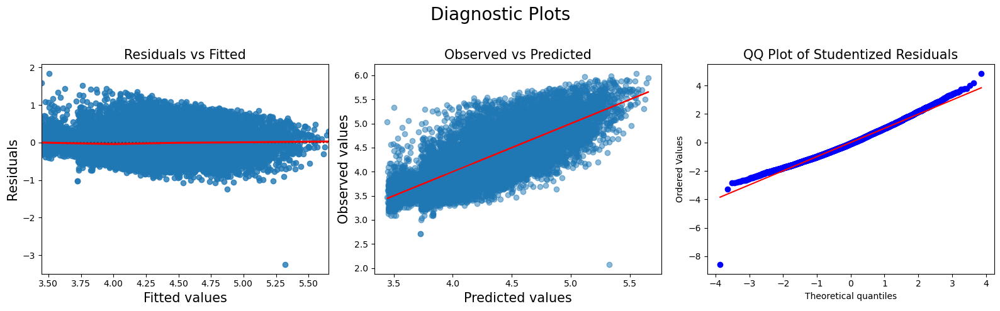

In [91]:
plot_diagnostic_plots(model_ols_ommited_3)

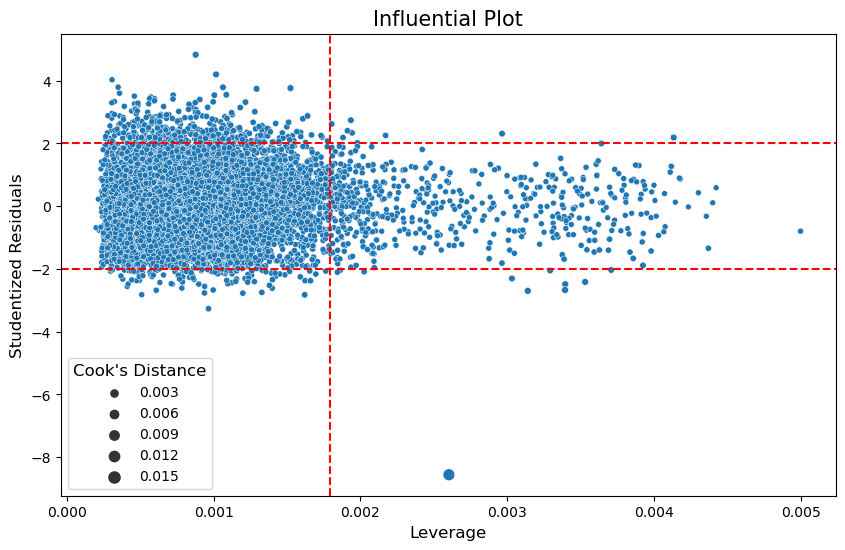

In [92]:
influential_plot(model_ols_ommited_3)

The model using selected Yeo-Johnson transformations shows an improvement in the model specification, enhancing the properties of the residuals. In this model, there is still the presence of heteroscedasticity, but it is corrected with the use of FGLS. Regarding the previous model, by analyzing the confidence interval of the adjusted R-squared through bootstrapping, it can be observed that the model with selected transformations has a statistically similar fit to the previous model. This model is preferable because the dependent variable can be interpreted as a semi-elasticity.

<h3 id="comparison-summary">Comparison Summary</h3>
<a href="#index">Return to Index</a>

Below are the different comparison statistics between the three proposed models, calculated through bootstrapping and showing the 95

| Metric | Model 1 | Model 2 | Model 3 |
|---|---|---|---|
| R Squared | 0.425 | 0.59 | 0.592 |
| R Squared (Lower Bound) | 0.409 | 0.584 | 0.576 |
| R Squared (Upper Bound) | 0.441 | 0.614 | 0.607 |
| Adjusted R Squared | 0.425 | 0.599 | 0.592 |
| Adjusted R Squared (Lower Bound) | 0.409 | 0.583 | 0.576 |
| Adjusted R Squared (Upper Bound) | 0.44 | 0.614 | 0.607 |
| AIC | 123153.28 | -8616.17 | 10921.27 |
| AIC (Lower Bound) | 122606.58 | -8974.27 | 10565.77 |
| AIC (Upper Bound) | 123698.21 | -8244.03 | 11295.61 |
| BIC | 123234.29 | -8534.59 | 11002.85 |
| BIC (Lower Bound) | 122688.17 | -8892.69 | 10647.35 |
| BIC (Upper Bound) | 123779.8 | -8162.45 | 11377.19 |
| Standard Deviation | 4.04 | 3.39 | 3.45 |
| Standard Deviation (Lower Bound) | 3.99 | 3.28 | 3.34 |
| Standard Deviation (Upper Bound) | 4.21 | 3.51 | 3.57 |
| Mean RMSE CV | 40.3 | 0.17 | 0.38 |
| Mean RMSE CV over Standard Deviation | 9.98 | 0.05 | 0.11 |

From the table, it can be seen that model 1 has the lowest explanatory power and also presents the highest values of AIC and BIC. On the other hand, models 2 and 3 have similar explanatory power, but model 2 has lower AIC and BIC. The metrics of average RMSE from cross-validation over the standard deviation allow us to compare between models, showing that model 2 performs better.

Given that the loss of explanatory power between models 2 and 3 is minimal, model 3 is chosen as the final model because the marginal effects could be interpreted as semi-elasticities.

<h2 id="analysis-of-the-selected-model">Analysis of the Selected Model</h2>
<a href="#index">Return to Index</a>

As explained in the previous section, the selected model includes the Yeo-Johnson transformations selected for each variable. From this model, the estimation using FGLS is as follows:

In [93]:
models_fgls_with_ommited_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.592
Model:                            WLS   Adj. R-squared:                  0.591
Method:                 Least Squares   F-statistic:                     1870.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:25:47   Log-Likelihood:                -5446.2
No. Observations:               12295   AIC:                         1.091e+04
Df Residuals:                   12284   BIC:                         1.100e+04
Df Model:                          10                                         
Covariance Type:                  HC1                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 3.4749      0.008    414.833      0.000       3.459       3.491
depends               0.3807      0.010     37.062      0.000       0.361       0.401
imports               0.4003      0.009     42.914      0.000       0.382       0.419
r_size                7.6445      0.214     35.659      0.000       7.224       8.065
src_size             21.7790      0.680     32.027      0.000      20.446      23.112
doc_size             47.7405      1.795     26.594      0.000      44.222      51.259
data_size             1.3296      0.138      9.655      0.000       1.060       1.599
Roxygen               0.0031      0.008      0.384      0.701      -0.013       0.019
gh                    0.0121      0.008      1.438      0.150      -0.004       0.029
depends imports      -0.1188      0.011    -10.967      0.000      -0.140      -0.098
src_size doc_size  -613.7533    230.030     -2.668      0.008   -1064.604    -162.902
==============================================================================
Omnibus:                      511.550   Durbin-Watson:                   1.881
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              667.581
Skew:                           0.436   Prob(JB):                    1.09e-145
Kurtosis:                       3.736   Cond. No.                     1.15e+05
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The condition number is large, 1.15e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

<h3 id="robustness-analysis">Robustness Analysis</h3>
<a href="#index">Return to Index</a>

Below are the estimators with a 95% bootstrap confidence interval for the selected model. To improve the robustness of the estimates, FGLS estimators and 5000 repetitions are used.

In [94]:
# ----- Bootstrap Estimation -----
boot_results_3, b_conf_int_3 = bootstrap_estimation(X_with_imitted_3, Y_3, fgls=True, n_boots=5000, cov_type='HC1')

╔════════════════════════════════════════════════╗
║ ----- 95% Bootstrap Confidence Intervals ----- ║
╚════════════════════════════════════════════════╝
5000 Simulations
════════════════
                           mean         lower         upper
const                  3.474514      3.458895      3.490454
depends                0.381547      0.361095      0.402308
imports                0.400613      0.381053      0.420528
r_size                 7.642293      7.224276      8.061772
src_size              21.791080     20.443742     23.205957
doc_size              47.760299     44.195713     51.342642
data_size              1.323171      1.045934      1.606251
Roxygen                0.003103     -0.012713      0.019212
gh                     0.012038     -0.004591      0.029079
depends imports       -0.119265     -0.142774     -0.095446
src_size doc_size   -614.281556  -1075.740567   -172.006725
R2                     0.592337      0.576158      0.608159
adjR2                  0.592005  

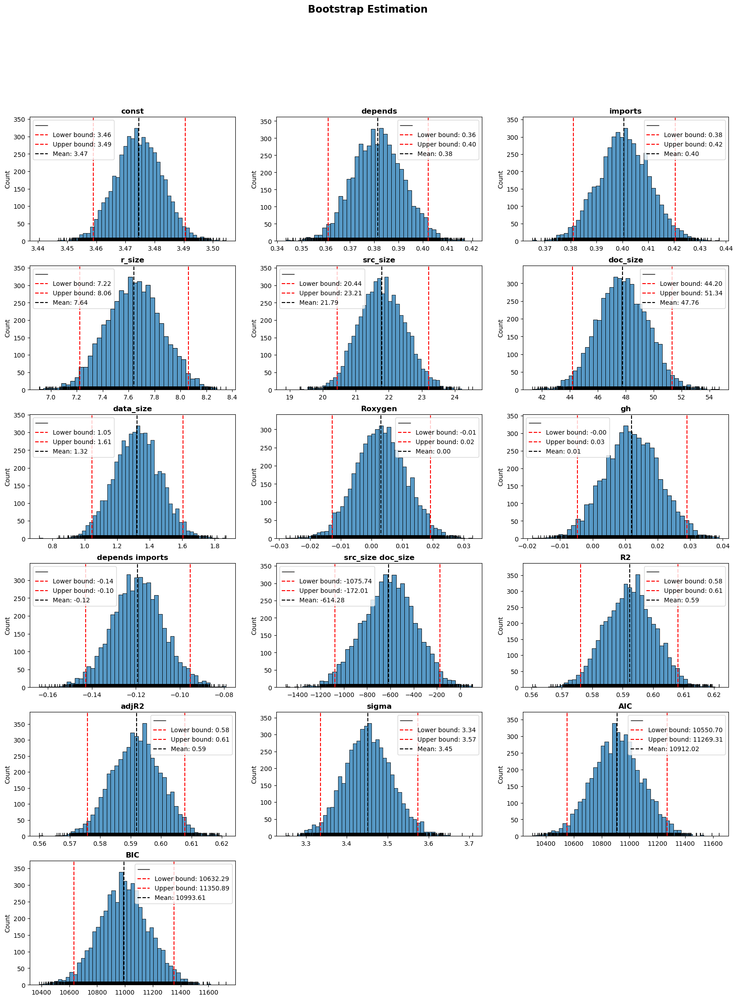

In [95]:
_ = mosaic_boot(boot_results_3, boot_results_3.columns, figsize=(20, 25), ncols=3, title_fontsize=12)

From the robustness analysis, it can be observed that the explanatory power of the model fluctuates between 0.58 and 0.61. Additionally, it is observed that the categorical variables `Roxygen` and `gh` have a confidence interval that crosses zero, indicating that they are not statistically significant. Their presence in the model is justified by the need to control for different documentation frameworks and the need to control for the use of GitHub as a code repository, which are often used in development frameworks that require more validation time.

<h3 id="cross-validation">Cross-Validation</h3>
<a href="#index">Return to Index</a>

In [96]:
# ----- Cross Validation -----

scores_3 = cross_validation(X_with_imitted_3, Y_3, nfolds = 5, test_size = 0.3, verbose = True)

╔══════════════════════════════╗
║ ----- Cross Validation ----- ║
╚══════════════════════════════╝
 C.V. Parameters
╭───────────────
├ Test Size: 30.0 %
├ N. Folds: 5
├ Amount of data for Testing: 3689
├ Amount of data for Training: 8606
╰ Amount of data per fold: 1721.2


        ----- General Performance -----
        MAE: 0.30089196343790253
        MSE: 0.14100509204087375
        RMSE: 0.3755064474025363
        
        ----- RMSE per Fold -----
        [0.38778246 0.38316465 0.37732271 0.37785207 0.37381841]
        ------------------------------
        Average RMSE: 0.3799880599558151
        


From the cross-validation procedure and estimation via bootstrap, it can be estimated that the average RMSE is 0.38. Given that the mean of the dependent variable is 4.35, it can be said that our model has an average error of 8.7%, which is a low value. Therefore, it can be concluded that the selected model is robust.

<h3 id="marginal-effects-analysis-and-parameter-interpretation">Marginal Effects Analysis and Parameter Interpretation</h3>
<a href="#index">Return to Index</a>

Below are once again the results of the estimation of the selected model.

In [97]:
models_fgls_with_ommited_3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            WLS Regression Results                            
==============================================================================
Dep. Variable:             check_time   R-squared:                       0.592
Model:                            WLS   Adj. R-squared:                  0.591
Method:                 Least Squares   F-statistic:                     1870.
Date:                Tue, 21 Nov 2023   Prob (F-statistic):               0.00
Time:                        15:28:10   Log-Likelihood:                -5446.2
No. Observations:               12295   AIC:                         1.091e+04
Df Residuals:                   12284   BIC:                         1.100e+04
Df Model:                          10                                         
Covariance Type:                  HC1                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 3.4749      0.008    414.833      0.000       3.459       3.491
depends               0.3807      0.010     37.062      0.000       0.361       0.401
imports               0.4003      0.009     42.914      0.000       0.382       0.419
r_size                7.6445      0.214     35.659      0.000       7.224       8.065
src_size             21.7790      0.680     32.027      0.000      20.446      23.112
doc_size             47.7405      1.795     26.594      0.000      44.222      51.259
data_size             1.3296      0.138      9.655      0.000       1.060       1.599
Roxygen               0.0031      0.008      0.384      0.701      -0.013       0.019
gh                    0.0121      0.008      1.438      0.150      -0.004       0.029
depends imports      -0.1188      0.011    -10.967      0.000      -0.140      -0.098
src_size doc_size  -613.7533    230.030     -2.668      0.008   -1064.604    -162.902
==============================================================================
Omnibus:                      511.550   Durbin-Watson:                   1.881
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              667.581
Skew:                           0.436   Prob(JB):                    1.09e-145
Kurtosis:                       3.736   Cond. No.                     1.15e+05
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC1)
[2] The condition number is large, 1.15e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Because our coefficients correspond to transformed variables, the marginal effects do not have a direct interpretation, except for those derived from the categorical variables.

From the categorical variables, it can be observed that both `Roxygen` and `gh` have a positive effect on the dependent variable, indicating that including GitHub links and adding Roxygen documentation increases the validation time. The addition of Roxygen increases the validation time by 0.3%, while the addition of GitHub links increases the validation time by 1.2%. It can be noted that these increases in time are low and not significant.

To calculate the marginal effect of a transformed variable that does not have interaction effects, the following formula is used:
$$
\frac{1}{y}\frac{\partial y}{\partial x_i} = \beta_i \left(x_i + 1\right)^{\lambda_i - 1}
$$

This means that the percentage change in the dependent variable $y$ with a change in the independent variable $x_i$ depends on the level of the same. Because of this, the coefficient $\beta_i$ does not have a direct interpretation, but it is possible to analyze the percentage response of the dependent variable given the observed values of $x_i$.

In [98]:
def margin_no_interactions(data, variable, estimation, lambdas):
    
    # ----- DataFrame with coefficients -----
    temp_params = pd.DataFrame(estimation.params).T
    # Variable coefficient estimation
    temp_beta = temp_params[variable][0] 
    # Transformation lambda yeo-johnson
    temp_lmbd = lambdas[variable][0]
    # ----- Range of the variables -----
    rng_1 = np.linspace(data[variable].min(), data[variable].max(), 1000)
    # ----- Marginal effects -----
    margin = temp_beta * (rng_1 + 1)**(temp_lmbd -1 )
    
    return rng_1, margin

Text(0.5, 0.98, 'Marginal Effect on check_time (as a Semielasticity)')

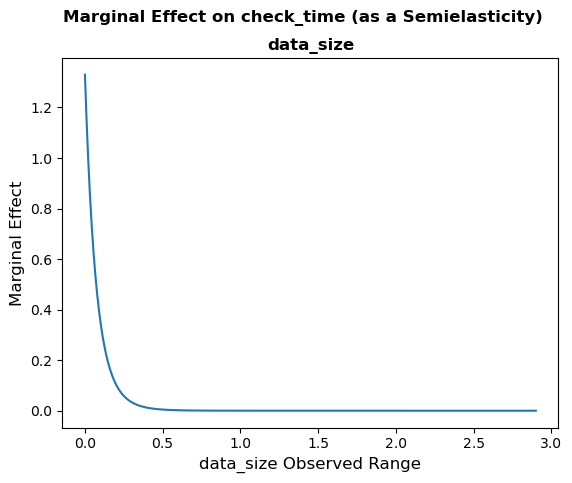

In [99]:
rng_1, margin = margin_no_interactions(data_filtered, 'data_size', models_fgls_with_ommited_3, lmbd)
fig, ax = plt.subplots()
ax.plot(rng_1, margin)
ax.set_title('data_size', fontsize=12, fontweight='bold')
ax.set_xlabel('data_size Observed Range', fontsize=12)
ax.set_ylabel('Marginal Effect', fontsize=12)
fig.suptitle('Marginal Effect on check_time (as a Semielasticity)', fontsize=12, fontweight='bold')

It can be observed that as the size of the data loaded into the package increases, the validation time also increases. However, each additional unit of data size has a diminishing marginal effect on the validation time. This can be seen in the graph, where the slope of the curve is decreasing.

To calculate the marginal effect of a transformed variable with interaction effects, the following formula is used:
$$
\frac{1}{y}\frac{\partial y}{\partial x_i} = \beta_i \left(x_i + 1\right)^{\lambda_i - 1} + \beta_{i,j}  \frac{(x_j + 1)^{\lambda_j} -1}{\lambda_j} (x_i + 1)^{\lambda_i - 1}
$$

This implies that percentage change in the dependent variable $y$ with a change in the independent variable $x_i$ depends on the level of the same and the level of $x_j$. Because of this, the coefficient $\beta_i$ or $\beta_{i,j}$ don't have a direct interpretation, but it is possible to analyze the percentage response of the dependent variable given the observed values of $x_i$ and $x_j$.

In [100]:
def margin_interactions(data, variable, interaction, estimation, lambdas):
    
    # ----- DataFrame with coefficients -----
    temp_params = pd.DataFrame(estimation.params).T
    # Variable coefficient estimation
    temp_beta = temp_params[variable][0]
    try:
        temp_gamma = temp_params[variable + ' ' + interaction][0]  
    except:
        temp_gamma = temp_params[interaction + ' ' + variable][0]  
    # Transformation lambda yeo-johnson
    temp_lmbd_1 = lambdas[variable][0]
    temp_lmbd_2 = lambdas[variable][0]
    # ----- Range of the variables -----
    rng_1 = np.linspace(data[variable].min(), data[variable].max(), 1000)
    rng_2 = np.linspace(data[interaction].min(), data[interaction].max(), 5)
    # ----- Marginal effects -----
    margin = [] 
    for i in range(len(rng_2)):
        margin_t0 = (rng_1 + 1)**(temp_lmbd_1 - 1)
        margin_t1 = temp_beta * margin_t0
        margin_t2 = temp_gamma * stats.yeojohnson(rng_2[i], lmbda=temp_lmbd_2) * margin_t0
        margin.append(margin_t1 + margin_t2)
    return rng_1, rng_2, margin

In [101]:
rng, inter, margin = margin_interactions(data_filtered, 'depends', 'imports', models_fgls_with_ommited_3, lmbd)

Text(0.5, 0.98, 'Marginal Effect on check_time (as a Semielasticity)')

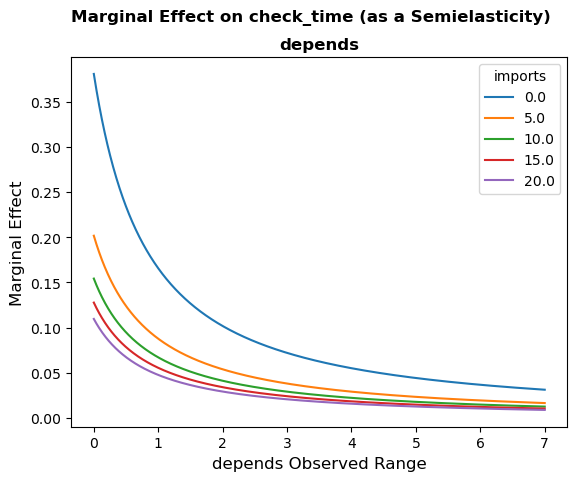

In [102]:
fig, ax = plt.subplots()
for i in range(len(margin)):
    ax.plot(rng, margin[i])
ax.legend(inter, title = 'imports')
ax.set_title('depends', fontsize=12, fontweight='bold')
ax.set_xlabel('depends Observed Range', fontsize=12)
ax.set_ylabel('Marginal Effect', fontsize=12)
fig.suptitle('Marginal Effect on check_time (as a Semielasticity)', fontsize=12, fontweight='bold')

In [103]:
rng, inter, margin = margin_interactions(data_filtered, 'imports', 'depends', models_fgls_with_ommited_3, lmbd)

Text(0.5, 0.98, 'Marginal Effect on check_time (as a Semielasticity)')

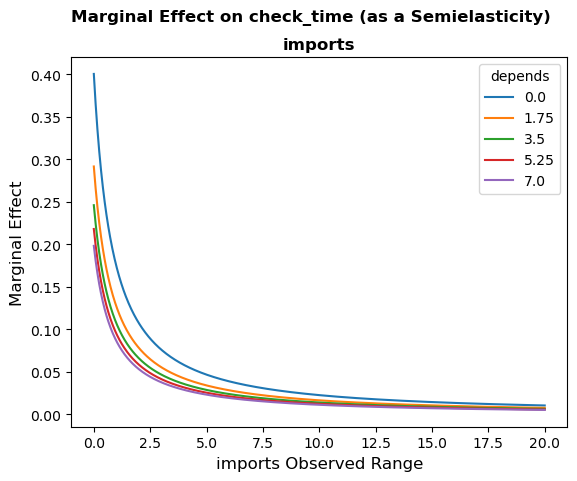

In [104]:
fig, ax = plt.subplots()
for i in range(len(margin)):
    ax.plot(rng, margin[i])
ax.legend(inter, title = 'depends')
ax.set_title('imports', fontsize=12, fontweight='bold')
ax.set_xlabel('imports Observed Range', fontsize=12)
ax.set_ylabel('Marginal Effect', fontsize=12)
fig.suptitle('Marginal Effect on check_time (as a Semielasticity)', fontsize=12, fontweight='bold')

It can be observed that the semi-elasticity of the validation time with respect to the variable `depends` is positive but decreasing. This indicates that as the number of dependencies increases, the validation time increases, but each additional unit of dependencies has a diminishing marginal effect on the validation time. Additionally, it can be observed that as `imports` increases, the marginal effect of `depends` on the elasticity of the validation time reduces. This means that as the number of imported packages increases, adding extra dependencies has a smaller marginal effect on the validation time.

This effect can also be observed when analyzing the marginal effects of `imports`. However, its marginal effects are not drastically altered when `depends` increases.

In [105]:
rng, inter, margin = margin_interactions(data_filtered, 'src_size', 'doc_size', models_fgls_with_ommited_3, lmbd)

Text(0.5, 0.98, 'Marginal Effect on check_time (as a Semielasticity)')

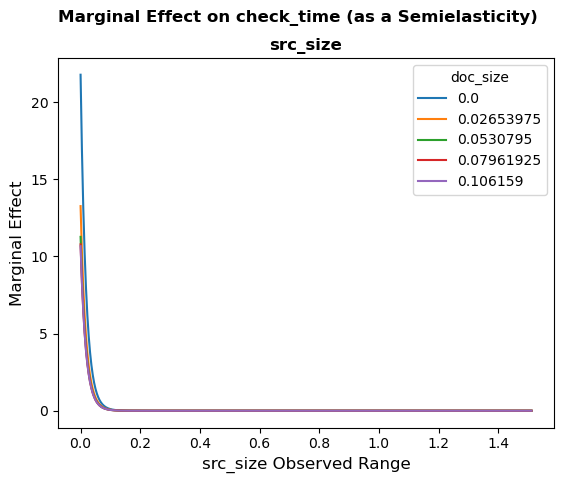

In [106]:
fig, ax = plt.subplots()
for i in range(len(margin)):
    ax.plot(rng, margin[i])
ax.legend(inter, title = 'doc_size')
ax.set_title('src_size', fontsize=12, fontweight='bold')
ax.set_xlabel('src_size Observed Range', fontsize=12)
ax.set_ylabel('Marginal Effect', fontsize=12)
fig.suptitle('Marginal Effect on check_time (as a Semielasticity)', fontsize=12, fontweight='bold')

In [107]:
rng, inter, margin = margin_interactions(data_filtered, 'doc_size', 'src_size', models_fgls_with_ommited_3, lmbd)

Text(0.5, 0.98, 'Marginal Effect on check_time (as a Semielasticity)')

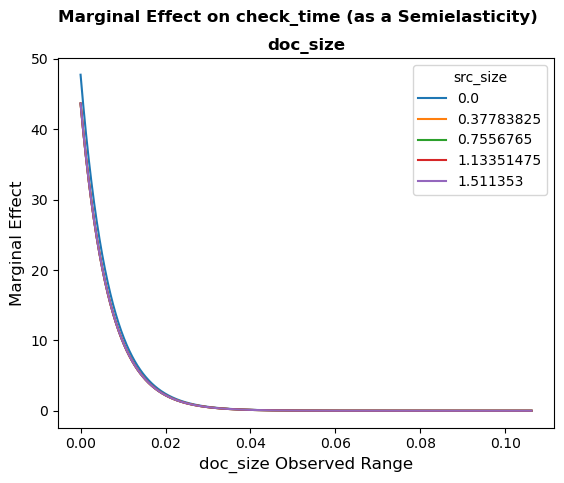

In [108]:
fig, ax = plt.subplots()
for i in range(len(margin)):
    ax.plot(rng, margin[i])
ax.legend(inter, title = 'src_size')
ax.set_title('doc_size', fontsize=12, fontweight='bold')
ax.set_xlabel('doc_size Observed Range', fontsize=12)
ax.set_ylabel('Marginal Effect', fontsize=12)
fig.suptitle('Marginal Effect on check_time (as a Semielasticity)', fontsize=12, fontweight='bold')

It can be observed that both `src_size` and `doc_size` have positive marginal effects, which means that as they increase, the percentage change of `check_times` is positive. This increase appears to decline as they increase, and additionally, as they increase, they also reduce the marginal effect of the variable with which they interact.

It can also be observed that the marginal effect of `src_size` decreases rapidly, indicating that an increase in the size of the `src` folder does not significantly increase the validation time of the package.

From the previous analysis, it can be noted that the highest semi-elasticity is found in the marginal effect of `doc_size`, indicating that when constructing a package, careful consideration should be given to the amount of documentation added, as it tends to increase the validation time more than the other variables.